## 이커머스 데이터 분석

## Instacart Market Basket Analysis -식료품 

### 데이터 팀의 일 
- 어떤 제품을 '다시' 구매할 것인지
- 장바구니에 어떤 제품을 담을 것인지

### Data sets
- aisles.csv
- departments.csv
- order_products__*.csv
- orders.csv
- products.csv
- sample_submission.csv

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

In [2]:
# aisle
aisle = pd.read_csv('aisles.csv')
aisle['aisle'].value_counts() # 134개 겁나 많네;;
aisle
# aisle = 제품 카테고리  

# other? 

# aisle[aisle['aisle'].str.contains('care')]

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation
...,...,...
129,130,hot cereal pancake mixes
130,131,dry pasta
131,132,beauty
132,133,muscles joints pain relief


In [3]:
# departments.csv  # 제품 부서 (aisle보다 더 큰 카테고리)
department = pd.read_csv('departments.csv')
department

# department에도 other이 있네? 


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol
5,6,international
6,7,beverages
7,8,pets
8,9,dry goods pasta
9,10,bulk


In [4]:
# order_products__prior 
order_products = pd.read_csv('order_products__prior.csv')
order_products.head(30).sort_values(by='order_id')
order_products['order_id'].max()

3421083

In [5]:
# order_products__train
order_products_train = pd.read_csv('order_products__train.csv')
order_products_train.head(30).sort_values(by='order_id')
order_products_train['order_id'].min()

1

In [6]:
# orders.csv
orders = pd.read_csv('orders.csv')
orders.sort_values(by='order_id').head(30)

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
1868044,1,112108,train,4,4,10,9.0
3355525,2,202279,prior,3,5,9,8.0
3417191,3,205970,prior,16,5,17,12.0
2958007,4,178520,prior,36,1,9,7.0
2593373,5,156122,prior,42,6,16,9.0
370620,6,22352,prior,4,1,12,30.0
2374153,7,142903,prior,11,2,14,30.0
50028,8,3107,prior,5,4,6,17.0
2308534,9,139016,prior,14,0,19,5.0
2249060,10,135442,prior,4,6,8,8.0


In [7]:
# products.csv # product_id /제품 이름 / aisle / department_id
products = pd.read_csv('products.csv')
products

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13
...,...,...,...,...
49683,49684,"Vodka, Triple Distilled, Twist of Vanilla",124,5
49684,49685,En Croute Roast Hazelnut Cranberry,42,1
49685,49686,Artisan Baguette,112,3
49686,49687,Smartblend Healthy Metabolism Dry Cat Food,41,8


## 전처리

In [8]:
def reduce_memory_usage(df):
    
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype.name
        if ((col_type != 'datetime64[ns]') & (col_type != 'category')):
            if (col_type != 'object'):
                c_min = df[col].min()
                c_max = df[col].max()

                if str(col_type)[:3] == 'int':
                    if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)

                else:
                    if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                        df[col] = df[col].astype(np.float16)
                    elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                        df[col] = df[col].astype(np.float32)
                    else:
                        pass
            else:
                df[col] = df[col].astype('category')
    mem_usg = df.memory_usage().sum() / 1024**2 
    print("Memory usage became: ",mem_usg," MB")
    
    return df


In [9]:
chunkList = pd.read_csv('order_info.csv',chunksize=100000)
order_info=pd.DataFrame()
for chunk in chunkList:
    order_info = pd.concat([order_info,reduce_memory_usage(chunk)])


Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of dataframe is 7.63 MB
Memory usage became:  1.9078140258789062  MB
Memory usage of 

In [10]:
order_info= order_info.drop('Unnamed: 0',axis=1)

In [11]:
# order_info
order_info

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부
0,2539329,1,1,수,8,-1,196,1,0
1,2539329,1,1,수,8,-1,14084,2,0
2,2539329,1,1,수,8,-1,12427,3,0
3,2539329,1,1,수,8,-1,26088,4,0
4,2539329,1,1,수,8,-1,26405,5,0
...,...,...,...,...,...,...,...,...,...
32434484,2977660,206209,13,화,12,7,14197,5,1
32434485,2977660,206209,13,화,12,7,38730,6,0
32434486,2977660,206209,13,화,12,7,31477,7,0
32434487,2977660,206209,13,화,12,7,6567,8,0


In [12]:
product_info=pd.read_csv('product_info.csv')
product_info=product_info.drop('Unnamed: 0',axis=1)

In [13]:
# product_info
product_info

,제품 ID,제품명,소분류 ID,대분류 ID,소분류명,대분류명
0,1,Chocolate Sandwich Cookies,61,19,cookies cakes,snacks
1,2,All-Seasons Salt,104,13,spices seasonings,pantry
2,3,Robust Golden Unsweetened Oolong Tea,94,7,tea,beverages
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1,frozen meals,frozen
4,5,Green Chile Anytime Sauce,5,13,marinades meat preparation,pantry
...,...,...,...,...,...,...
49683,49684,"Vodka, Triple Distilled, Twist of Vanilla",124,5,spirits,alcohol
49684,49685,En Croute Roast Hazelnut Cranberry,42,1,frozen vegan vegetarian,frozen
49685,49686,Artisan Baguette,112,3,bread,bakery
49686,49687,Smartblend Healthy Metabolism Dry Cat Food,41,8,cat food care,pets


In [14]:
chunkList2 = pd.read_csv('total_info.csv',chunksize=100000)
total_info=pd.DataFrame()
for chunk in chunkList2:
    total_info = pd.concat([total_info,reduce_memory_usage(chunk)])


Memory usage of dataframe is 11.44 MB
Memory usage became:  3.0235633850097656  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.022418975830078  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.020732879638672  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.020252227783203  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.0229530334472656  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.019001007080078  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.020740509033203  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.019634246826172  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.016582489013672  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.0222434997558594  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.023021697998047  MB
Memory usage of dataframe is 11.44 MB
Memory usage became:  3.022869110107422  MB
Memory usage 

In [15]:
# total_info
total_info=total_info.drop('Unnamed: 0',axis=1)

In [16]:
total_info

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부,제품명,소분류 ID,대분류 ID,소분류명,대분류명
0,2539329,1,1,수,8,-1,196,1,0,Soda,77,7,soft drinks,beverages
1,2539329,1,1,수,8,-1,14084,2,0,Organic Unsweetened Vanilla Almond Milk,91,16,soy lactosefree,dairy eggs
2,2539329,1,1,수,8,-1,12427,3,0,Original Beef Jerky,23,19,popcorn jerky,snacks
3,2539329,1,1,수,8,-1,26088,4,0,Aged White Cheddar Popcorn,23,19,popcorn jerky,snacks
4,2539329,1,1,수,8,-1,26405,5,0,XL Pick-A-Size Paper Towel Rolls,54,17,paper goods,household
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434484,2977660,206209,13,화,12,7,14197,5,1,Tomato Paste,9,9,pasta sauce,dry goods pasta
32434485,2977660,206209,13,화,12,7,38730,6,0,Brownie Crunch High Protein Bar,3,19,energy granola bars,snacks
32434486,2977660,206209,13,화,12,7,31477,7,0,High Protein Bar Chunky Peanut Butter,3,19,energy granola bars,snacks
32434487,2977660,206209,13,화,12,7,6567,8,0,Chocolate Peanut Butter Protein Bar,3,19,energy granola bars,snacks


## 데이터셋 EDA

In [17]:
# 주문횟수 ==> 고객이 이 마트에서 장을 몇번째 보고있냐. 

In [18]:
order_info[order_info['고객 ID']==1]

# total_info[total_info['고객 ID']==1]

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부
0,2539329,1,1,수,8,-1,196,1,0
1,2539329,1,1,수,8,-1,14084,2,0
2,2539329,1,1,수,8,-1,12427,3,0
3,2539329,1,1,수,8,-1,26088,4,0
4,2539329,1,1,수,8,-1,26405,5,0
5,2398795,1,2,목,7,15,196,1,1
6,2398795,1,2,목,7,15,10258,2,0
7,2398795,1,2,목,7,15,12427,3,1
8,2398795,1,2,목,7,15,13176,4,0
9,2398795,1,2,목,7,15,26088,5,1


In [19]:
# total 고객 수  # 206,209명
total_info['고객 ID'].nunique()

# total 주문 건수  # 3,214,874번
total_info.groupby('고객 ID')['주문 횟수'].max().sum()

# total 제품수  # 49,688개 
product_info
product_info['제품 ID'].nunique()

49688

In [20]:
product_info

#대분류 개수 # 21개 
product_info['대분류명'].nunique()
#소분류 개수 # 134개
product_info['소분류명'].nunique()

134

In [21]:
product_info.groupby('대분류명')['소분류명'].nunique()

대분류명
alcohol             5
babies              4
bakery              5
beverages           8
breakfast           4
bulk                2
canned goods        5
dairy eggs         10
deli                5
dry goods pasta     5
frozen             11
household          10
international       4
meat seafood        7
missing             1
other               1
pantry             12
personal care      17
pets                2
produce             5
snacks             11
Name: 소분류명, dtype: int64

In [22]:
product_info.groupby('소분류명')['제품명'].nunique()

소분류명
air fresheners candles            355
asian foods                       605
baby accessories                   44
baby bath body care               132
baby food formula                 718
                                 ... 
trash bags liners                 112
vitamins supplements             1038
water seltzer sparkling water     344
white wines                       147
yogurt                           1026
Name: 제품명, Length: 134, dtype: int64

In [23]:
# total_info 상관관계
total_info.corr(numeric_only=True)

,주문 ID,고객 ID,주문 횟수,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부,소분류 ID,대분류 ID
주문 ID,1.000000,-0.000482,-0.000543,0.000652,0.000649,-0.000082,-0.000320,-0.000253,-0.000063,-0.000229
고객 ID,-0.000482,1.000000,-0.000768,-0.000415,0.000439,0.000080,0.000729,-0.000862,-0.000114,0.000056
주문 횟수,-0.000543,-0.000768,1.000000,-0.040049,-0.249080,-0.001925,-0.004228,0.306840,-0.000293,0.000529
주문 시각,0.000652,-0.000415,-0.040049,1.000000,-0.000530,0.000942,-0.014805,-0.023300,-0.001134,-0.008837
주문 간격,0.000649,0.000439,-0.249080,-0.000530,1.000000,0.000542,0.049870,-0.015715,0.005299,0.000966
제품 ID,-0.000082,0.000080,-0.001925,0.000942,0.000542,1.000000,0.005529,0.003718,0.002254,-0.028503
카트 추가 순서,-0.000320,0.000729,-0.004228,-0.014805,0.049870,0.005529,1.000000,-0.133024,0.009451,0.029437
재주문 여부,-0.000253,-0.000862,0.306840,-0.023300,-0.015715,0.003718,-0.133024,1.000000,0.003924,-0.039371
소분류 ID,-0.000063,-0.000114,-0.000293,-0.001134,0.005299,0.002254,0.009451,0.003924,1.000000,0.062203
대분류 ID,-0.000229,0.000056,0.000529,-0.008837,0.000966,-0.028503,0.029437,-0.039371,0.062203,1.000000


In [24]:
# 대분류에서 가장 많이 팔리는 => produce
total_info_count = total_info['대분류명'].value_counts().to_frame().reset_index()
total_info_count

,대분류명,count
0,produce,9479291
1,dairy eggs,5414016
2,snacks,2887550
3,beverages,2690129
4,frozen,2236432
5,pantry,1875577
6,bakery,1176787
7,canned goods,1068058
8,deli,1051249
9,dry goods pasta,866627


In [25]:
plt.rc("font", family = "Malgun Gothic")
sns.set(font="Malgun Gothic", 
rc={"axes.unicode_minus":False}, style='white')

C:\Users\user\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


Text(0.5, 0, '대분류명')

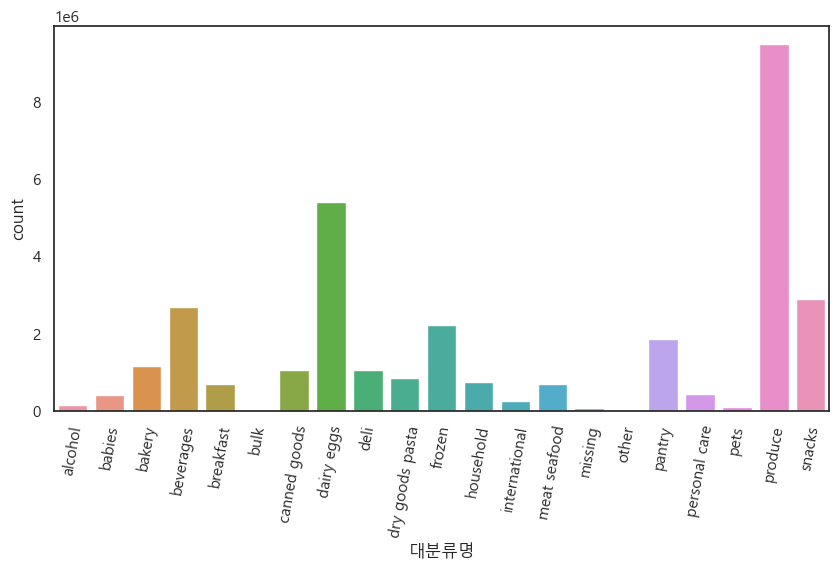

In [26]:
plt.figure(figsize=(10,5))
sns.barplot(data=total_info_count, x='대분류명', y='count')
plt.xticks(rotation=80)
plt.xlabel('대분류명')

In [27]:
# 소분류에서 가장 많이 팔리는 => fressh fruits
aisle_top10=total_info['소분류명'].value_counts().head(10).to_frame().reset_index()
aisle_top10

,소분류명,count
0,fresh fruits,3642188
1,fresh vegetables,3418021
2,packaged vegetables fruits,1765313
3,yogurt,1452343
4,packaged cheese,979763
5,milk,891015
6,water seltzer sparkling water,841533
7,chips pretzels,722470
8,soy lactosefree,638253
9,bread,584834


Text(0.5, 0, '소분류명')

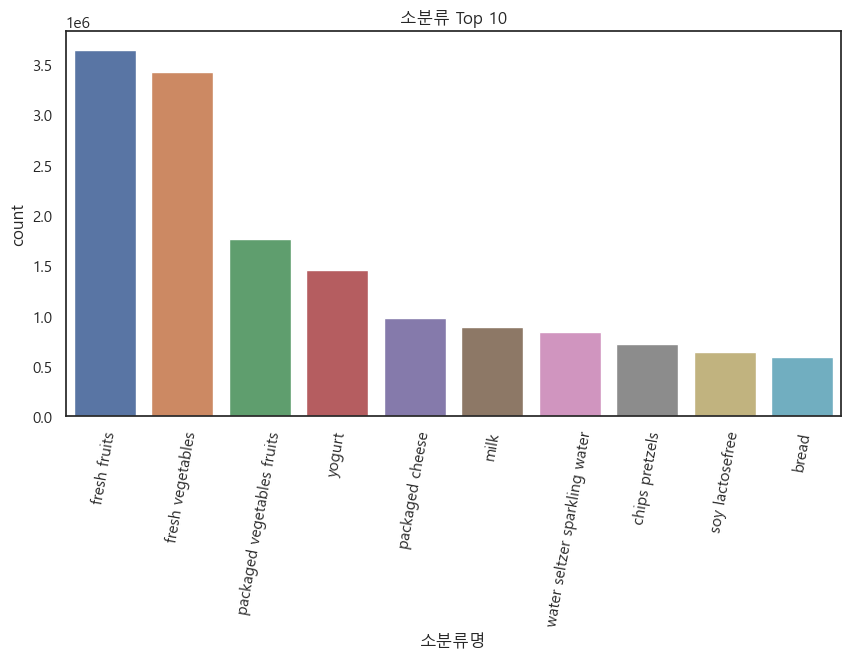

In [28]:
plt.figure(figsize=(10,5))
plt.title('소분류 Top 10')
sns.barplot(data=aisle_top10,x='소분류명', y='count')
plt.xticks(rotation=80)
plt.xlabel('소분류명')

In [29]:
# 제품 에서 가장 많이 팔리는 => banana
product_top10 =total_info['제품명'].value_counts().to_frame().head(10).reset_index()
product_top10

,제품명,count
0,Banana,472565
1,Bag of Organic Bananas,379450
2,Organic Strawberries,264683
3,Organic Baby Spinach,241921
4,Organic Hass Avocado,213584
5,Organic Avocado,176815
6,Large Lemon,152657
7,Strawberries,142951
8,Limes,140627
9,Organic Whole Milk,137905


Text(0.5, 0, '제품명')

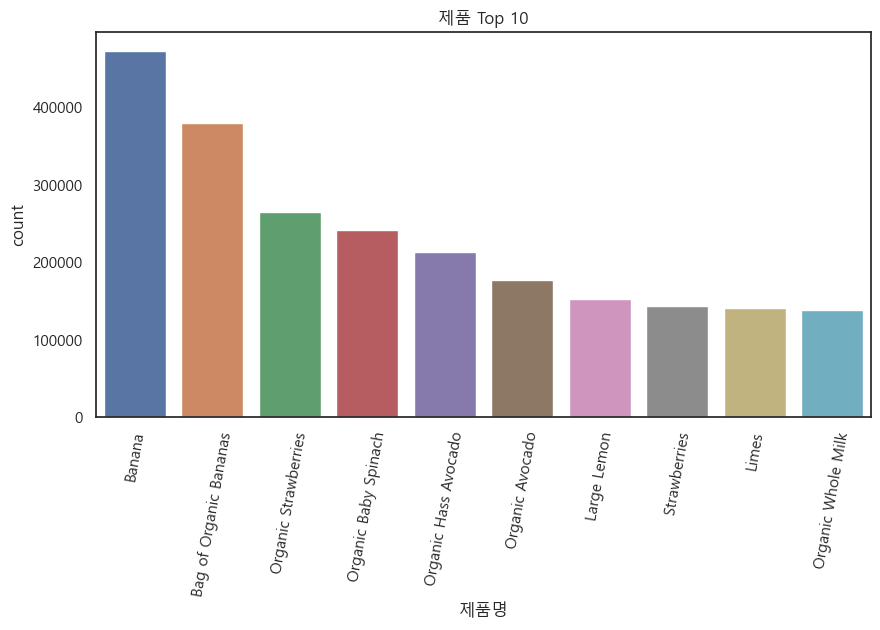

In [30]:
plt.figure(figsize=(10,5))
plt.title('제품 Top 10')
sns.barplot(data=product_top10,x='제품명', y='count')
plt.xticks(rotation=80)
plt.xlabel('제품명')

In [31]:
# 분류별 value_counts 한번에 보기 
total_info[['대분류명','소분류명','제품명']].value_counts()

대분류명           소분류명                        제품명                         
produce        fresh fruits                Banana                          472565
                                           Bag of Organic Bananas          379450
                                           Organic Strawberries            264683
               packaged vegetables fruits  Organic Baby Spinach            241921
               fresh fruits                Organic Hass Avocado            213584
                                                                            ...  
personal care  facial care                 Deep Clean Cleanser & Mask           1
international  indian foods                Punjabi Chhole, Hot Spicy            1
pantry         preserved dips spreads      Salsa, Black Bean                    1
               pickled goods olives        Greek Pitted Kalamata Olives         1
alcohol        beers coolers               'Swingtop' Premium Lager             1
Name: count, Length: 49677

In [32]:
# total_info.groupby('고객 ID')['주문 횟수'].max().to_frame().reset_index()
total_info.groupby('고객 ID')['주문 횟수'].max().to_frame().reset_index().groupby('주문 횟수').count()


,고객 ID
주문 횟수,
3,23986
4,19590
5,16165
6,13850
7,11700
...,...
95,67
96,54
97,50


In [33]:
total_info.groupby('주문 횟수')['고객 ID'].value_counts()

주문 횟수  고객 ID 
1      149996    98
       185459    96
       60694     95
       124623    93
       300       89
                 ..
99     82232      1
       75124      1
       90584      1
       93942      1
       86804      1
Name: count, Length: 3214874, dtype: int64

In [34]:
fig = px.colors.qualitative.swatches()
fig.show()
plt.rc("font", family = "Malgun Gothic")
sns.set(font="Malgun Gothic", 
rc={"axes.unicode_minus":False}, style='white')

## 고객 세그먼트 분류

- 구매 최근성
- 구매 빈도
- 구매 규모
- 구매 횟수

In [35]:
order_info

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부
0,2539329,1,1,수,8,-1,196,1,0
1,2539329,1,1,수,8,-1,14084,2,0
2,2539329,1,1,수,8,-1,12427,3,0
3,2539329,1,1,수,8,-1,26088,4,0
4,2539329,1,1,수,8,-1,26405,5,0
...,...,...,...,...,...,...,...,...,...
32434484,2977660,206209,13,화,12,7,14197,5,1
32434485,2977660,206209,13,화,12,7,38730,6,0
32434486,2977660,206209,13,화,12,7,31477,7,0
32434487,2977660,206209,13,화,12,7,6567,8,0


### 🔵 구매 횟수(최대 구매 횟수)

In [36]:
# 구매 횟수 

df=order_info.groupby('고객 ID')['주문 횟수'].max().to_frame().reset_index().groupby('주문 횟수').count().reset_index()
df['비율'] = df['고객 ID'] / df['고객 ID'].sum() * 100 
df = df.rename({'고객 ID':'고객 수'}, axis=1)
df['누적 비율'] = df['비율'].cumsum() 
df

df['점수'] = pd.cut(df['누적 비율'], bins=[0, 20, 40, 60, 80, 100], labels=[1, 2, 3, 4, 5])
df


,주문 횟수,고객 수,비율,누적 비율,점수
0,3,23986,11.631888,11.631888,1
1,4,19590,9.500070,21.131958,2
2,5,16165,7.839134,28.971092,2
3,6,13850,6.716487,35.687579,2
4,7,11700,5.673855,41.361434,3
...,...,...,...,...,...
92,95,67,0.032491,99.260459,5
93,96,54,0.026187,99.286646,5
94,97,50,0.024247,99.310893,5
95,98,47,0.022792,99.333686,5


In [37]:
fig = px.bar(data_frame = df , x = '주문 횟수', y ='고객 수', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

In [38]:
fig = px.box(data_frame = df, x = '주문 횟수', y ='점수', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

In [39]:
# 고객 ID 당 점수 할당을 위한 새로운 테이블 제작 

o = order_info.groupby('고객 ID')['주문 횟수'].value_counts().to_frame().reset_index()
o=o.drop('주문 횟수', axis=1)
o=o.drop('count', axis=1)

df_def =o.drop_duplicates('고객 ID')
df_def = df_def.reset_index(drop= True)

AA =order_info.groupby('고객 ID')['주문 횟수'].max().to_frame().reset_index()
# AA
df_def['주문 횟수'] = AA['주문 횟수']


df_def= df_def.rename({'주문 횟수':'구매횟수'}, axis=1)
df_def

,고객 ID,구매횟수
0,1,10
1,2,14
2,3,12
3,4,5
4,5,4
...,...,...
206204,206205,3
206205,206206,67
206206,206207,16
206207,206208,49


In [40]:
# 점수 할당 함수 ==> 구매 횟수(최대 구매 횟수)

def assign_score(order_count, df):
    if order_count in df['주문 횟수'].values:
        return df.loc[df['주문 횟수'] == order_count, '점수'].values[0]
    else:
        return None

df_def['구매횟수 점수'] = df_def['구매횟수'].apply(lambda x: assign_score(x, df))

df_def

,고객 ID,구매횟수,구매횟수 점수
0,1,10,3
1,2,14,4
2,3,12,4
3,4,5,2
4,5,4,2
...,...,...,...
206204,206205,3,1
206205,206206,67,5
206206,206207,16,4
206207,206208,49,5


### 🔵구매 규모 (총 몇개를 구매했니?)

In [41]:
# 구매 규모 (고객 한명당 총 구매 규모 -> 총 몇개 구매했는지 ) Monetary
Monetary = order_info.groupby('고객 ID')['주문 횟수'].count().to_frame().reset_index()
Monetary= Monetary.groupby('주문 횟수')['고객 ID'].count().to_frame().reset_index()
Monetary= Monetary.rename({'고객 ID':'고객수'} ,axis=1)
Monetary= Monetary.rename({'주문 횟수':'주문 개수'} ,axis=1)

Monetary['고객비율'] = Monetary['고객수'] / Monetary['고객수'].sum() * 100
Monetary['누적비율'] = Monetary['고객비율'].cumsum()
Monetary['점수'] = pd.cut(Monetary['누적비율'], bins=[0, 20, 40, 60, 80, 100], labels = [1, 2, 3, 4, 5])
Monetary

# Monetary[Monetary['주문 개수']==129]

,주문 개수,고객수,고객비율,누적비율,점수
0,3,305,0.147908,0.147908,1
1,4,490,0.237623,0.385531,1
2,5,673,0.326368,0.711899,1
3,6,809,0.392320,1.104220,1
4,7,962,0.466517,1.570736,1
...,...,...,...,...,...
1703,2921,1,0.000485,99.998060,5
1704,2936,1,0.000485,99.998545,5
1705,3061,1,0.000485,99.999030,5
1706,3638,1,0.000485,99.999515,5


In [42]:
fig = px.line(data_frame = Monetary , x = '주문 개수', y ='고객수', color_discrete_sequence = px.colors.qualitative.Pastel1, height = 100)
fig.show()

In [43]:
fig = px.box(data_frame = Monetary, x = '주문 개수', y ='점수', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

In [44]:
# 고객 ID 당 점수 할당을 위한 새로운 테이블 제작 

M = order_info.groupby('고객 ID')['주문 횟수'].count().to_frame().reset_index()
M=M.drop('주문 횟수', axis=1)


Monetary_def = M
Monetary_def

BB =order_info.groupby('고객 ID')['주문 횟수'].count().to_frame().reset_index()
Monetary_def['주문 횟수'] = BB['주문 횟수']
Monetary_def=Monetary_def.rename({'주문 횟수':'구매 규모'}, axis=1)
Monetary_def

,고객 ID,구매 규모
0,1,59
1,2,195
2,3,88
3,4,18
4,5,37
...,...,...
206204,206205,32
206205,206206,285
206206,206207,223
206207,206208,677


In [45]:
# 점수 할당 함수 ==> 구매 규모 (총 몇개를 구매했니?)

def assign_score(order_scale, Monetary):
    if order_scale in Monetary['주문 개수'].values:
        return Monetary.loc[Monetary['주문 개수'] == order_scale, '점수'].values[0]
    else:
        return None

Monetary_def['주문개수 점수'] = Monetary_def['구매 규모'].apply(lambda x: assign_score(x, Monetary))

Monetary_def

# def assign_score(order_count, df):
#     if order_count in df['주문 횟수'].values:
#         return df.loc[df['주문 횟수'] == order_count, '점수'].values[0]
#     else:
#         return None

# df_def['구매횟수 점수'] = df_def['주문 횟수'].apply(lambda x: assign_score(x, df))

# df_def

,고객 ID,구매 규모,주문개수 점수
0,1,59,2
1,2,195,4
2,3,88,3
3,4,18,1
4,5,37,2
...,...,...,...
206204,206205,32,1
206205,206206,285,5
206206,206207,223,4
206207,206208,677,5


### 🔵 하루 평균 몇개를 구매하는지 

In [46]:
# 고객한명당 하루 평균 구매 규모 -> 하루 평균 몇개 구매하는 지  Monetary_day
order= order_info.groupby('고객 ID')['주문 횟수'].value_counts().to_frame()
order=order.groupby('고객 ID')['count'].sum().to_frame().reset_index()

order_count=order_info.groupby('고객 ID')['주문 횟수'].max().to_frame().reset_index()
order_count['주문 횟수']

order['총주문회수']=order_count['주문 횟수']
# # NULL 해결~!!!! 😭

order['하루 평균 구매수'] = order['count']/order['총주문회수']


# 분포 구하기
order_day = order.groupby('하루 평균 구매수')['고객 ID'].count().to_frame().reset_index()
order_day = order_day.rename({'고객 ID':'고객수'}, axis=1)

order_day['비율'] = order_day['고객수']/order_day['고객수'].sum() *100
order_day['누적비율'] = order_day['비율'].cumsum()
order_day['점수'] = pd.cut(order_day['누적비율'], bins=[0,20,40,60,80,100], labels=[1,2,3,4,5])
order_day


,하루 평균 구매수,고객수,비율,누적비율,점수
0,1.000000,706,0.342371,0.342371,1
1,1.022727,1,0.000485,0.342856,1
2,1.025641,2,0.000970,0.343826,1
3,1.027027,1,0.000485,0.344311,1
4,1.029412,1,0.000485,0.344796,1
...,...,...,...,...,...
18924,58.500000,1,0.000485,99.998060,5
18925,59.000000,1,0.000485,99.998545,5
18926,61.000000,1,0.000485,99.999030,5
18927,62.000000,1,0.000485,99.999515,5


In [47]:
fig = px.line(data_frame = order_day , x = '하루 평균 구매수', y ='고객수', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

In [48]:
fig = px.box(data_frame = order_day, x = '하루 평균 구매수', y ='점수', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

In [49]:
# 고객 ID 당 점수 할당을 위한 새로운 테이블 제작 

D = order_info.groupby('고객 ID')['주문 횟수'].count().to_frame().reset_index()
D=D.drop('주문 횟수', axis=1)
D

# order_day_def = D


# 하루평균구매수 할당

def assign_daily_avg_score(daily_avg, order_day):
    if daily_avg in order_day['하루 평균 구매수'].values:
        return order_day.loc[order_day['하루 평균 구매수'] == daily_avg, '점수'].values[0]
    else:
        return None

# D 데이터프레임 생성
D = order_info.groupby('고객 ID')['주문 횟수'].count().to_frame().reset_index().drop('주문 횟수', axis=1)

# 고객당 하루 평균 구매수 추가
order_day_def = D.merge(order[['고객 ID', '하루 평균 구매수']], on='고객 ID', how='left')

# 점수 할당
order_day_def['하루평균구매 점수'] = order_day_def['하루 평균 구매수'].apply(lambda x: assign_daily_avg_score(x, order_day))

order_day_def

,고객 ID,하루 평균 구매수,하루평균구매 점수
0,1,5.900000,2
1,2,13.928571,4
2,3,7.333333,2
3,4,3.600000,1
4,5,9.250000,3
...,...,...,...
206204,206205,10.666667,4
206205,206206,4.253731,1
206206,206207,13.937500,4
206207,206208,13.816327,4


### 🔵 구매 빈도 

In [50]:
# 구매 빈도 
a = order_info.groupby('고객 ID')['주문 간격'].value_counts().to_frame().reset_index()
F = a.groupby('고객 ID')['주문 간격'].sum().to_frame().reset_index()
F = F.rename({'주문 간격': '주문간격 합'}, axis=1)

F['주문간격 합']=F['주문간격 합']+1
F_count = a.groupby('고객 ID')['주문 간격'].count().to_frame().reset_index()
F['평균주문간격'] = F['주문간격 합'] / F_count['주문 간격']
F

Frequency=F.groupby('평균주문간격')['고객 ID'].count().to_frame().reset_index()
Frequency
Frequency=Frequency.rename({'고객 ID' : '고객수'}, axis=1)
Frequency

Frequency['비율']=Frequency['고객수'] / Frequency['고객수'].sum() *100
Frequency['누적비율']=Frequency['비율'].cumsum()
Frequency['점수']= pd.cut(Frequency['누적비율'], bins=[0,20,40,60,80,100], labels=[5,4,3,2,1])
Frequency

,평균주문간격,고객수,비율,누적비율,점수
0,0.000000,24,0.011639,0.011639,5
1,0.333333,40,0.019398,0.031036,5
2,0.500000,28,0.013578,0.044615,5
3,0.666667,22,0.010669,0.055284,5
4,0.750000,24,0.011639,0.066922,5
...,...,...,...,...,...
1783,23.142857,2,0.000970,99.997575,1
1784,23.166667,2,0.000970,99.998545,1
1785,23.250000,1,0.000485,99.999030,1
1786,23.333333,1,0.000485,99.999515,1


In [51]:
fig = px.line(data_frame = Frequency , x = '평균주문간격', y ='고객수', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

In [52]:
fig = px.box(data_frame = Frequency, x = '평균주문간격', y ='점수', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

In [53]:
E = order_info.groupby('고객 ID')['주문 횟수'].count().to_frame().reset_index()
E=E.drop('주문 횟수', axis=1)
E
Frequency_def = E
Frequency_def

def assign_frequency_score(avg_interval, Frequency):
    if avg_interval in Frequency['평균주문간격'].values:
        return Frequency.loc[Frequency['평균주문간격'] == avg_interval, '점수'].values[0]
    else:
        return None

Frequency_def = E.merge(F[['고객 ID', '평균주문간격']], on='고객 ID', how='left')

Frequency_def['주문간격 점수'] = Frequency_def['평균주문간격'].apply(lambda x: assign_frequency_score(x, Frequency))
Frequency_def

,고객 ID,평균주문간격,주문간격 점수
0,1,17.600000,1
1,2,13.900000,2
2,3,12.444444,3
3,4,11.000000,3
4,5,10.000000,4
...,...,...,...
206204,206205,13.333333,2
206205,206206,6.666667,5
206206,206207,11.200000,3
206207,206208,8.705882,4


### 🔵 점수 합산 -> 고객 등급 분류

In [54]:
# df_def['구매규모'] = df_def['고객 ID'].map(Monetary_def.set_index('고객 ID')['구매 규모'])
# df_def['하루평균구매수'] = df_def['고객 ID'].map(order_day_def.set_index('고객 ID')['하루 평균 구매수'])
# df_def['구매빈도'] = df_def['고객 ID'].map(Frequency_def.set_index('고객 ID')['평균주문간격'])
# df_def

In [55]:
# df_def.corr()

In [56]:
# # sns.pairplot(data=df_def)
# sns.lmplot(data=df_def, x='구매횟수', y='구매빈도')

In [57]:
# df_def Monetary_def  
# 합계 내림차순 정렬 
score_0 = pd.merge(df_def,Monetary_def, on= '고객 ID', how= 'left')
score_0=score_0.drop('구매횟수', axis=1)
score_0=score_0.drop('구매 규모', axis=1)

score_1 = pd.merge(score_0,order_day_def, on= '고객 ID', how= 'left')
score_1=score_1.drop('하루 평균 구매수', axis=1)

score = pd.merge(score_1,Frequency_def,on= '고객 ID', how= 'left')
score=score.drop('평균주문간격', axis=1)
score

score['점수 합계'] = score.loc[:,'구매횟수 점수':'주문간격 점수'].sum(axis=1)
score


,고객 ID,구매횟수 점수,주문개수 점수,하루평균구매 점수,주문간격 점수,점수 합계
0,1,3,2,2,1,8
1,2,4,4,4,2,14
2,3,4,3,2,3,12
3,4,2,1,1,3,7
4,5,2,2,3,4,11
...,...,...,...,...,...,...
206204,206205,1,1,4,2,8
206205,206206,5,5,1,5,16
206206,206207,4,4,4,3,15
206207,206208,5,5,4,4,18


In [58]:
# 점수 분포 만들기
score_dist_0 = score[['고객 ID', '점수 합계']].sort_values(by='점수 합계')

score_dist = score_dist_0.groupby('점수 합계').count().reset_index()
score_dist = score_dist.rename({'고객 ID': '고객수'}, axis=1)
score_dist['비율'] = score_dist['고객수'] / score_dist['고객수'].sum()*100
score_dist['누적비율'] = score_dist['비율'].cumsum()
score_dist['등급'] = pd.cut(score_dist['누적비율'], bins=[0,20,40,60,80,100], labels=['E','D','C','B','A'])
score_dist


,점수 합계,고객수,비율,누적비율,등급
0,4,2646,1.283164,1.283164,E
1,5,7010,3.399464,4.682628,E
2,6,9277,4.498834,9.181462,E
3,7,8727,4.232114,13.413576,E
4,8,14834,7.193672,20.607248,D
5,9,15389,7.462817,28.070065,D
6,10,16657,8.077727,36.147792,D
7,11,17310,8.394396,44.542188,C
8,12,17534,8.503024,53.045211,C
9,13,17904,8.682453,61.727665,B


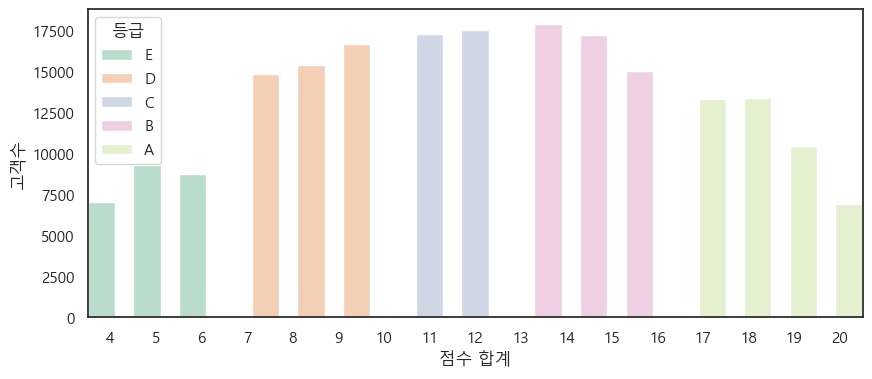

In [59]:
# sns.barplot(data=score_dist, x='점수 합계', y='고객수')
# plt.show()
plt.figure(figsize=(10, 4))
sns.barplot(data=score_dist, x='점수 합계', y='고객수', hue='등급', width=3, palette="Pastel2")
plt.show()

In [60]:
a = score_dist.groupby('등급')[['고객수','비율']].sum()
a['누적비율'] = a['비율'].cumsum()
a['등급a'] = pd.cut(a['누적비율'], bins=[0,20,40,60,80,100], labels=['E','D','C','B','A'])
a

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2625314911.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,고객수,비율,누적비율,등급a
등급,,,,
E,27660,13.413576,13.413576,E
D,46880,22.734216,36.147792,D
C,34844,16.897420,53.045211,C
B,50166,24.327745,77.372957,B
A,46659,22.627043,100.000000,A


In [61]:
qq =pd.pivot_table(a, columns='등급a', values='누적비율')
qq=qq.reset_index()

C:\Users\user\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



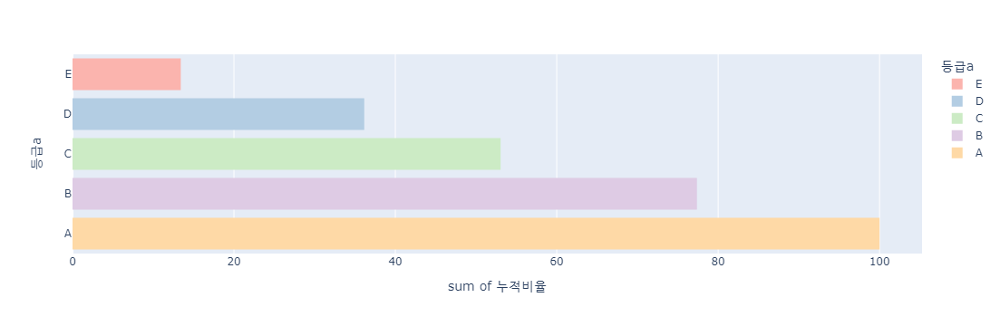

In [62]:
fig = px.histogram(data_frame = a , x = '누적비율', y ='등급a', color='등급a', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

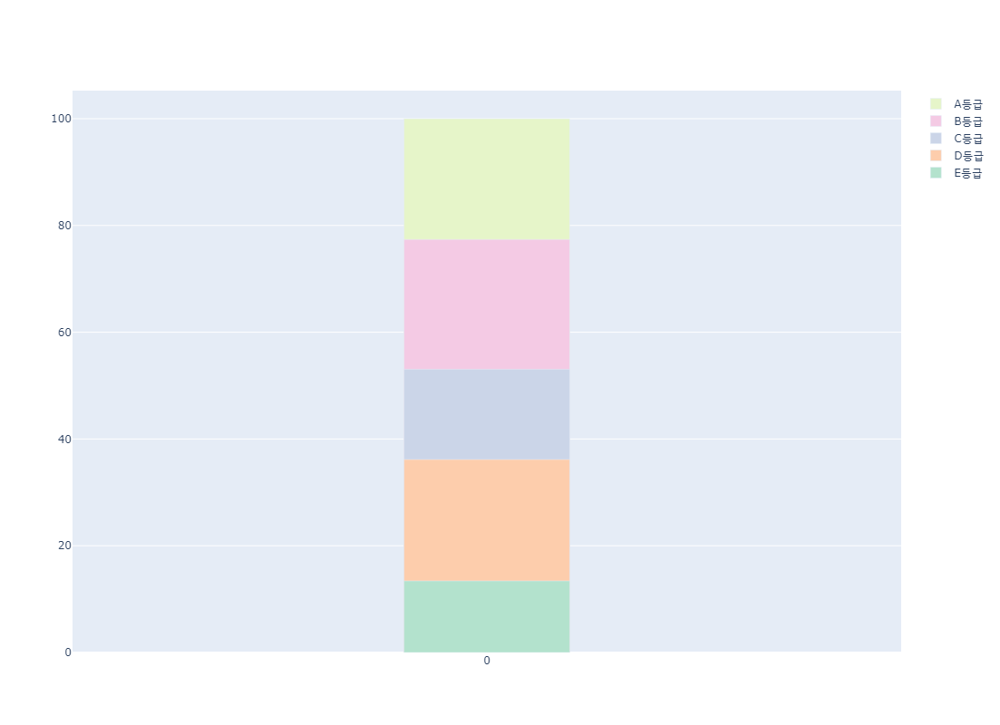

In [63]:
# fig=px.bar(data_frame=a, y='비율', color='등급a')
# fig.show()

fig = go.Figure(
    data = [
        go.Bar(y=qq['A'],name='A등급', offsetgroup='비율', marker_color=px.colors.qualitative.Pastel2[4]),
        go.Bar(y=qq['B'], name='B등급',offsetgroup='비율', marker_color=px.colors.qualitative.Pastel2[3]),
        go.Bar(y=qq['C'], name='C등급',offsetgroup='비율',marker_color=px.colors.qualitative.Pastel2[2]),
        go.Bar(y=qq['D'],name='D등급', offsetgroup='비율',marker_color=px.colors.qualitative.Pastel2[1]),
        go.Bar(y=qq['E'], name='E등급', offsetgroup='비율',marker_color=px.colors.qualitative.Pastel2[0])
    ])
fig.update_layout(bargap=0.8, height=800)
fig.show()

C:\Users\user\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



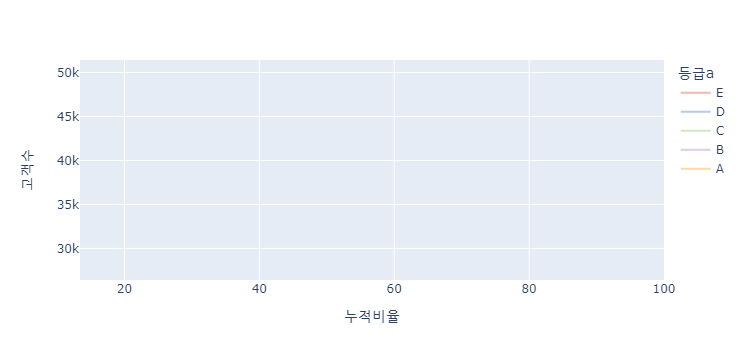

In [64]:
fig = px.line(data_frame = a , x = '누적비율', y ='고객수', color='등급a', color_discrete_sequence = px.colors.qualitative.Pastel1)
fig.show()

### 🔵 고객 등급 표

In [65]:
Final = score[['고객 ID', '점수 합계']]

def assign_ranking(score_sum, score_dist):
    if score_sum in score_dist['점수 합계'].values:
        return score_dist.loc[score_dist['점수 합계'] == score_sum, '등급'].values[0]
    else:
        return None

Final['고객 등급'] = Final['점수 합계'].apply(lambda x: assign_ranking(x, score_dist))

Rank_info = Final


# def assign_frequency_score(avg_interval, Frequency):
#     if avg_interval in Frequency['평균주문간격'].values:
#         return Frequency.loc[Frequency['평균주문간격'] == avg_interval, '점수'].values[0]
#     else:
#         return None

# Frequency_def = E.merge(F[['고객 ID', '평균주문간격']], on='고객 ID', how='left')

# Frequency_def['주문간격 점수'] = Frequency_def['평균주문간격'].apply(lambda x: assign_frequency_score(x, Frequency))
# Frequency_def

C:\Users\user\AppData\Local\Temp\ipykernel_8136\3158834017.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [66]:
Rank_info

,고객 ID,점수 합계,고객 등급
0,1,8,D
1,2,14,B
2,3,12,C
3,4,7,E
4,5,11,C
...,...,...,...
206204,206205,8,D
206205,206206,16,A
206206,206207,15,B
206207,206208,18,A


In [67]:
pd.pivot_table(Rank_info, index='고객 등급', values='점수 합계', aggfunc='mean')

,점수 합계
고객 등급,
A,17.402773
B,13.943209
C,11.503214
D,9.038887
E,5.870752


In [68]:
Rank_info.to_excel('Rank_info.xlsx')

## 고객 세그먼트별 EDA

In [69]:
# total_info[(total_info['고객 ID'] == 1) & (total_info['대분류명'] =='snacks')].count()
total_info

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부,제품명,소분류 ID,대분류 ID,소분류명,대분류명
0,2539329,1,1,수,8,-1,196,1,0,Soda,77,7,soft drinks,beverages
1,2539329,1,1,수,8,-1,14084,2,0,Organic Unsweetened Vanilla Almond Milk,91,16,soy lactosefree,dairy eggs
2,2539329,1,1,수,8,-1,12427,3,0,Original Beef Jerky,23,19,popcorn jerky,snacks
3,2539329,1,1,수,8,-1,26088,4,0,Aged White Cheddar Popcorn,23,19,popcorn jerky,snacks
4,2539329,1,1,수,8,-1,26405,5,0,XL Pick-A-Size Paper Towel Rolls,54,17,paper goods,household
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434484,2977660,206209,13,화,12,7,14197,5,1,Tomato Paste,9,9,pasta sauce,dry goods pasta
32434485,2977660,206209,13,화,12,7,38730,6,0,Brownie Crunch High Protein Bar,3,19,energy granola bars,snacks
32434486,2977660,206209,13,화,12,7,31477,7,0,High Protein Bar Chunky Peanut Butter,3,19,energy granola bars,snacks
32434487,2977660,206209,13,화,12,7,6567,8,0,Chocolate Peanut Butter Protein Bar,3,19,energy granola bars,snacks


### 🟠 등급별 대분류

In [70]:
# 대분류

product_seg =total_info.groupby('고객 ID')['대분류명'].value_counts().to_frame().reset_index()
product_seg['등급'] = product_seg['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])  # set_index⭐⭐ ( 컬럼 밀림 방지, null 방지)
product_seg

,고객 ID,대분류명,count,등급
0,1,snacks,22,D
1,1,beverages,13,D
2,1,dairy eggs,13,D
3,1,produce,5,D
4,1,breakfast,3,D
...,...,...,...,...
4330384,206209,other,0,B
4330385,206209,personal care,0,B
4330386,206209,babies,0,B
4330387,206209,alcohol,0,B


In [71]:
category_big = product_seg.groupby(['등급','대분류명'])['count'].sum().to_frame().reset_index()

# category_big[category_big['대분류명']=='alcohol']
# category_big.groupby('등급')['count'].sum()

category_big['count'].max()

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1433708531.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



6015444

In [72]:
plt.rc("font", family = "Malgun Gothic")
sns.set(font="Malgun Gothic", 
rc={"axes.unicode_minus":False}, style='white')

Text(0, 0.5, '구매횟수')

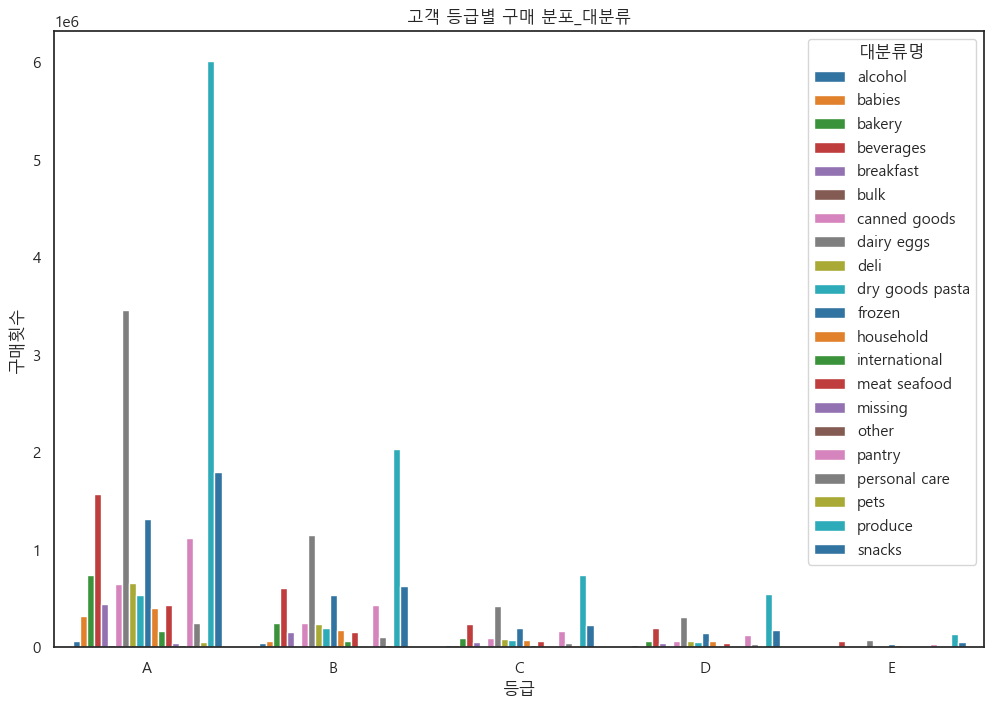

In [73]:
plt.figure(figsize=(12, 8))
sns.barplot(data=category_big, x='등급', y='count', hue='대분류명',palette='tab10')
plt.title('고객 등급별 구매 분포_대분류')
plt.ylabel('구매횟수')

### 🟠등급별 소분류 A~E

In [74]:
# 소분류 
product_seg_2 = total_info.groupby('고객 ID')['소분류명'].value_counts().to_frame().reset_index()
product_seg_2['등급'] = product_seg_2['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])
product_seg_2

,고객 ID,소분류명,count,등급
0,1,soft drinks,13,D
1,1,popcorn jerky,12,D
2,1,nuts seeds dried fruit,9,D
3,1,packaged cheese,8,D
4,1,fresh fruits,5,D
...,...,...,...,...
5729244,206209,pickled goods olives,1,B
5729245,206209,frozen produce,1,B
5729246,206209,frozen vegan vegetarian,1,B
5729247,206209,packaged poultry,1,B


In [75]:
# 소분류(A)
category_small=product_seg_2.groupby(['등급','소분류명'])['count'].sum().to_frame().reset_index()

category_small_A=category_small[category_small['등급']=='A']
A=category_small_A.sort_values(by='count', ascending=False).head(10)
A

,등급,소분류명,count
50,A,fresh fruits,2361644
53,A,fresh vegetables,2186058
98,A,packaged vegetables fruits,1120916
133,A,yogurt,965283
93,A,packaged cheese,622268
83,A,milk,576544
131,A,water seltzer sparkling water,482347
25,A,chips pretzels,443237
119,A,soy lactosefree,400869
11,A,bread,371648


In [76]:
fig=px.histogram(data_frame=A, x='등급', y='count', color='소분류명',barmode='group', width= 1100, height=500)
fig.show()

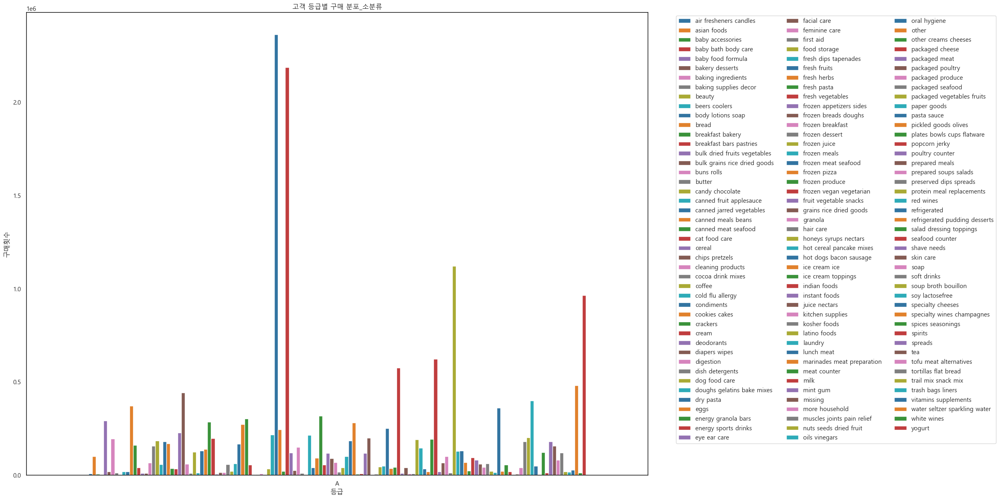

In [77]:
plt.figure(figsize=(20, 15))
sns.barplot(data=category_small_A, x='등급', y='count', hue='소분류명',palette='tab10')
plt.title('고객 등급별 구매 분포_소분류')
plt.ylabel('구매횟수')
plt.legend(loc='best', ncol=3, bbox_to_anchor=(1.04,1))

In [78]:
# 소분류(B)
category_small=product_seg_2.groupby(['등급','소분류명'])['count'].sum().to_frame().reset_index()

category_small_B=category_small[category_small['등급']=='B']
B= category_small_B.sort_values(by='count', ascending=False).head(10)
B

,등급,소분류명,count
184,B,fresh fruits,757662
187,B,fresh vegetables,744651
232,B,packaged vegetables fruits,381288
267,B,yogurt,295005
227,B,packaged cheese,209917
265,B,water seltzer sparkling water,190306
217,B,milk,183206
159,B,chips pretzels,160593
253,B,soy lactosefree,138515
244,B,refrigerated,125683


In [79]:
fig=px.histogram(data_frame=B, x='등급', y='count', color='소분류명',barmode='group', width= 1100, height=500)
fig.show()

In [80]:
# 소분류(C)
category_small=product_seg_2.groupby(['등급','소분류명'])['count'].sum().to_frame().reset_index()

category_small_C=category_small[category_small['등급']=='C']
C=category_small_C.sort_values(by='count', ascending=False).head(10)
C

,등급,소분류명,count
318,C,fresh fruits,272146
321,C,fresh vegetables,266434
366,C,packaged vegetables fruits,137310
401,C,yogurt,105653
361,C,packaged cheese,78037
399,C,water seltzer sparkling water,75527
351,C,milk,65040
293,C,chips pretzels,60272
387,C,soy lactosefree,51207
339,C,ice cream ice,47053


In [81]:
fig=px.histogram(data_frame=C, x='등급', y='count', color='소분류명',barmode='group', width= 1100, height=500)
fig.show()

In [82]:
# 소분류(D)
category_small=product_seg_2.groupby(['등급','소분류명'])['count'].sum().to_frame().reset_index()

category_small_D=category_small[category_small['등급']=='D']
D=category_small_D.sort_values(by='count', ascending=False).head(10)
D

,등급,소분류명,count
452,D,fresh fruits,199293
455,D,fresh vegetables,182656
500,D,packaged vegetables fruits,101225
535,D,yogurt,71067
533,D,water seltzer sparkling water,66516
495,D,packaged cheese,56125
485,D,milk,51402
427,D,chips pretzels,46044
498,D,packaged produce,45021
521,D,soy lactosefree,37824


In [83]:
fig=px.histogram(data_frame=D, x='등급', y='count', color='소분류명',barmode='group', width= 1100, height=500)
fig.show()

In [84]:
# 소분류(E)
category_small=product_seg_2.groupby(['등급','소분류명'])['count'].sum().to_frame().reset_index()

category_small_E=category_small[category_small['등급']=='E']
E=category_small_E.sort_values(by='count', ascending=False).head(10)
E

,등급,소분류명,count
586,E,fresh fruits,51443
589,E,fresh vegetables,38222
667,E,water seltzer sparkling water,26837
634,E,packaged vegetables fruits,24574
632,E,packaged produce,21745
669,E,yogurt,15335
619,E,milk,14823
653,E,soft drinks,14060
629,E,packaged cheese,13416
561,E,chips pretzels,12324


In [85]:
fig=px.histogram(data_frame=E, x='등급', y='count', color='소분류명',barmode='group', width= 1100, height=500)
fig.show()

### 🟠등급별 제품 A~E

In [86]:
total_info

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부,제품명,소분류 ID,대분류 ID,소분류명,대분류명
0,2539329,1,1,수,8,-1,196,1,0,Soda,77,7,soft drinks,beverages
1,2539329,1,1,수,8,-1,14084,2,0,Organic Unsweetened Vanilla Almond Milk,91,16,soy lactosefree,dairy eggs
2,2539329,1,1,수,8,-1,12427,3,0,Original Beef Jerky,23,19,popcorn jerky,snacks
3,2539329,1,1,수,8,-1,26088,4,0,Aged White Cheddar Popcorn,23,19,popcorn jerky,snacks
4,2539329,1,1,수,8,-1,26405,5,0,XL Pick-A-Size Paper Towel Rolls,54,17,paper goods,household
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434484,2977660,206209,13,화,12,7,14197,5,1,Tomato Paste,9,9,pasta sauce,dry goods pasta
32434485,2977660,206209,13,화,12,7,38730,6,0,Brownie Crunch High Protein Bar,3,19,energy granola bars,snacks
32434486,2977660,206209,13,화,12,7,31477,7,0,High Protein Bar Chunky Peanut Butter,3,19,energy granola bars,snacks
32434487,2977660,206209,13,화,12,7,6567,8,0,Chocolate Peanut Butter Protein Bar,3,19,energy granola bars,snacks


In [87]:
# 등급별 제품 분석 
product_seg_3 =total_info.groupby('고객 ID')['제품명'].value_counts().to_frame().reset_index()
product_seg_3['등급'] = product_seg_3['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])  
product_seg_3

,고객 ID,제품명,count,등급
0,1,Soda,10,D
1,1,Original Beef Jerky,10,D
2,1,Pistachios,9,D
3,1,Organic String Cheese,8,D
4,1,Cinnamon Toast Crunch,3,D
...,...,...,...,...
13307948,206209,Organic 1% Low Fat Milk,1,B
13307949,206209,Organic Diced Tomatoes,1,B
13307950,206209,Organic Mexican Blend Finely Shredded Cheese,1,B
13307951,206209,Organic Raw Unfiltered Apple Cider Vinegar,1,B


In [163]:
# 제품 -> A등급 
category_product=product_seg_3.groupby(['등급','제품명'])['count'].sum().to_frame().reset_index()
category_product

category_product_A=category_product[category_product['등급']=='C']
AA = category_product_A.sort_values(by='count', ascending=False).head(40)
AA

,등급,제품명,count
99387,C,Banana,38566
99209,C,Bag of Organic Bananas,26877
120881,C,Organic Baby Spinach,19242
123671,C,Organic Strawberries,16876
120847,C,Organic Avocado,15171
133183,C,Strawberries,13651
115412,C,Large Lemon,13229
122197,C,Organic Hass Avocado,13010
116282,C,Limes,10752
121028,C,Organic Blueberries,8766


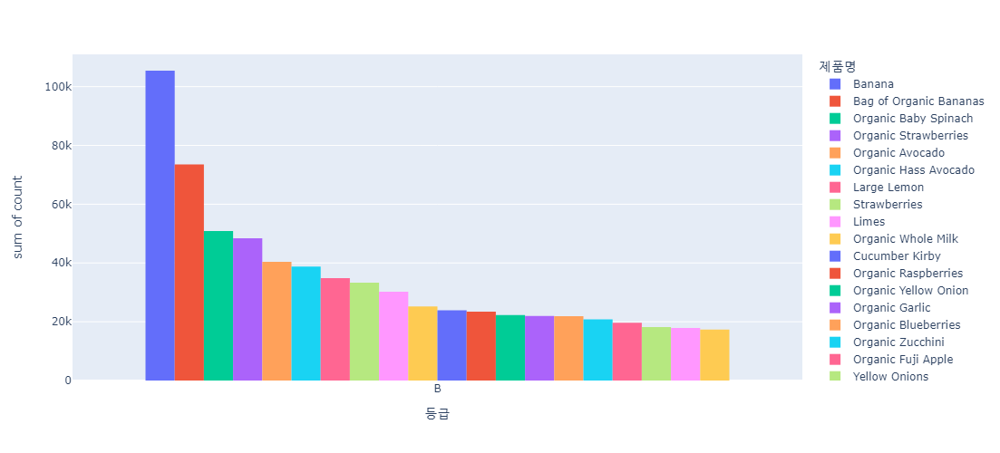

In [89]:
fig=px.histogram(data_frame=AA, x='등급', y='count', color='제품명',barmode='group', width= 1100, height=500)
fig.show()

In [90]:
# 제품 -> B등급 
category_product=product_seg_3.groupby(['등급','제품명'])['count'].sum().to_frame().reset_index()
category_product

category_product_B=category_product[category_product['등급']=='B']
BB= category_product_B.sort_values(by='count', ascending=False).head(20)
BB

,등급,제품명,count
52325,B,Banana,105441
52130,B,Bag of Organic Bananas,73511
76310,B,Organic Baby Spinach,50886
79303,B,Organic Strawberries,48417
76275,B,Organic Avocado,40374
77724,B,Organic Hass Avocado,38799
70195,B,Large Lemon,34836
89798,B,Strawberries,33318
71163,B,Limes,30241
79841,B,Organic Whole Milk,25166


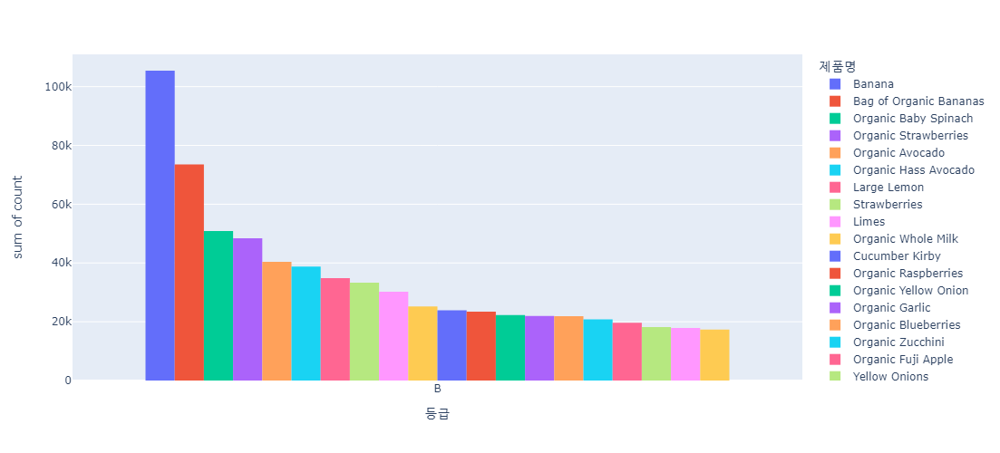

In [91]:
fig=px.histogram(data_frame=BB, x='등급', y='count', color='제품명',barmode='group', width= 1100, height=500)
fig.show()

In [92]:
# 제품 -> C등급 
category_product=product_seg_3.groupby(['등급','제품명'])['count'].sum().to_frame().reset_index()
category_product

category_product_C=category_product[category_product['등급']=='C']
CC= category_product_C.sort_values(by='count', ascending=False).head(20)
CC

,등급,제품명,count
99387,C,Banana,38566
99209,C,Bag of Organic Bananas,26877
120881,C,Organic Baby Spinach,19242
123671,C,Organic Strawberries,16876
120847,C,Organic Avocado,15171
133183,C,Strawberries,13651
115412,C,Large Lemon,13229
122197,C,Organic Hass Avocado,13010
116282,C,Limes,10752
121028,C,Organic Blueberries,8766


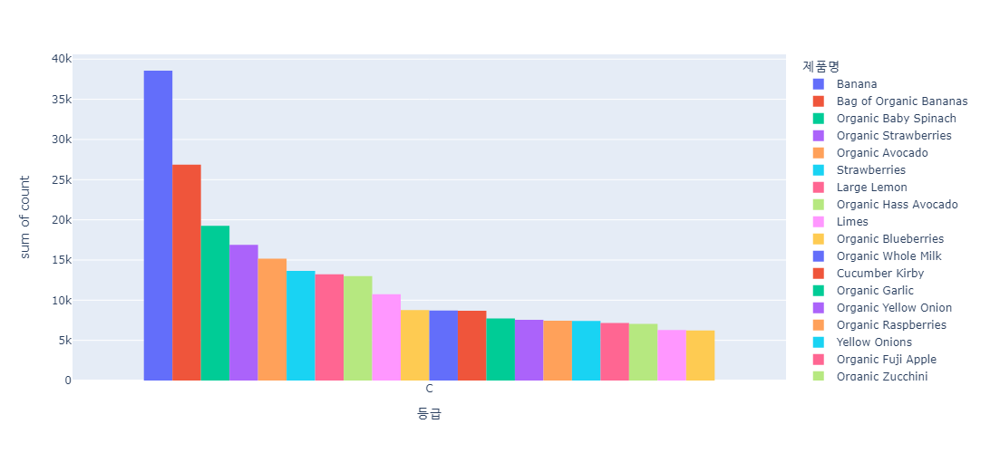

In [93]:
fig=px.histogram(data_frame=CC, x='등급', y='count', color='제품명',barmode='group', width= 1100, height=500)
fig.show()

In [94]:
# 제품 -> D등급 
category_product=product_seg_3.groupby(['등급','제품명'])['count'].sum().to_frame().reset_index()
category_product

category_product_D=category_product[category_product['등급']=='D']
DD =category_product_D.sort_values(by='count', ascending=False).head(20)
DD

,등급,제품명,count
141959,D,Banana,27228
141781,D,Bag of Organic Bananas,22880
162654,D,Organic Baby Spinach,15683
165355,D,Organic Strawberries,13177
174420,D,Strawberries,11535
162618,D,Organic Avocado,10701
157379,D,Large Lemon,8868
163929,D,Organic Hass Avocado,8475
162801,D,Organic Blueberries,7365
158205,D,Limes,7151


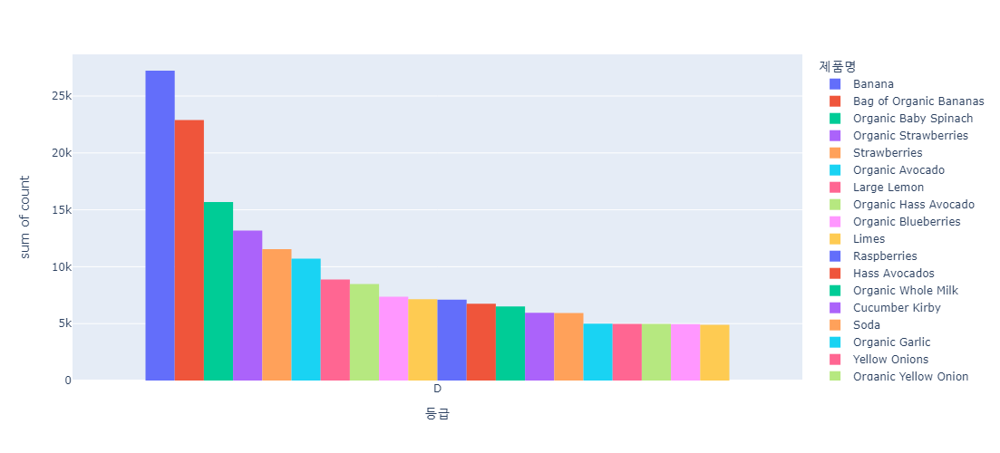

In [95]:
fig=px.histogram(data_frame=DD, x='등급', y='count', color='제품명',barmode='group', width= 1100, height=500)
fig.show()

In [96]:
# 제품 -> E등급 
category_product=product_seg_3.groupby(['등급','제품명'])['count'].sum().to_frame().reset_index()
category_product

category_product_E=category_product[category_product['등급']=='E']
EE = category_product_E.sort_values(by='count', ascending=False).head(20)
EE

,등급,제품명,count
181901,E,Bag of Organic Bananas,8155
182018,E,Banana,5906
196509,E,Organic Baby Spinach,4792
204118,E,Soda,4224
198576,E,Organic Strawberries,3854
204998,E,Strawberries,3715
191078,E,Hass Avocados,3228
201764,E,Raspberries,3191
204740,E,Spring Water,2984
196483,E,Organic Avocado,2280


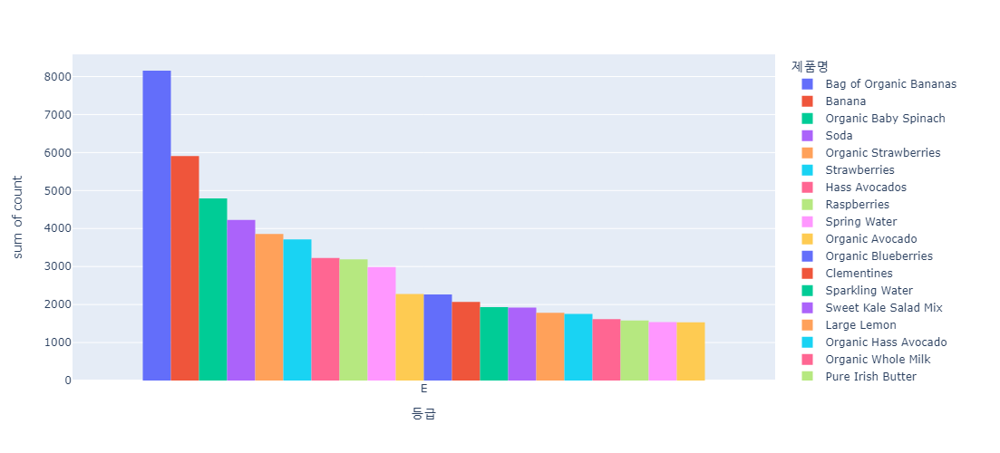

In [97]:
fig=px.histogram(data_frame=EE, x='등급', y='count', color='제품명',barmode='group', width= 1100, height=500)
fig.show()

### 🟠 소분류 groupby -> 제품

In [98]:
seg = total_info.groupby('고객 ID')[['소분류명','제품명']].value_counts().to_frame().reset_index()
seg['등급'] = seg['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])


seg.groupby(['등급','소분류명','제품명'])['count'].value_counts()

등급  소분류명                    제품명                                          count
A   air fresheners candles  100% Beeswax Hand Dipped Tapers              1        15
                                                                         5         1
                                                                         2         1
                            100% Pure & Certified Organic Lemon Oil      1         3
                            100% Pure Cedarwood Essential Oil            1        27
                                                                                  ..
E   yogurt                  Yotoddler Organic Pear Spinach Mango Yogurt  2         8
                                                                         3         2
                                                                         5         1
                                                                         4         1
                                                                       

In [99]:
seg

,고객 ID,소분류명,제품명,count,등급
0,1,popcorn jerky,Original Beef Jerky,10,D
1,1,soft drinks,Soda,10,D
2,1,nuts seeds dried fruit,Pistachios,9,D
3,1,packaged cheese,Organic String Cheese,8,D
4,1,cereal,Cinnamon Toast Crunch,3,D
...,...,...,...,...,...
13307948,206209,packaged vegetables fruits,Yellow Onion,1,B
13307949,206209,laundry,Ultra Downy Free & Gentle Liquid Fabric Condit...,1,B
13307950,206209,lunch meat,Oven Roasted Turkey Breast,1,B
13307951,206209,lunch meat,Chorizo,1,B


In [100]:
pp = seg[seg['소분류명']=='bread']


aa=pp.groupby(['등급','제품명'])['count'].sum().to_frame().reset_index()
aa


aa_A=aa[aa['등급']=='A']
aa_A.sort_values(by='count', ascending=False).head(10)

,등급,제품명,count
6,A,100% Whole Wheat Bread,39613
324,A,Organic Bread with 21 Whole Grains,16002
165,A,Ezekiel 4:9 Bread Organic Sprouted Whole Grain,10915
463,A,Sourdough Bread,10550
334,A,Organic Honey Sweet Whole Wheat Bread,9010
333,A,Organic Good Seed Bread,8272
317,A,Organic 21 Grain Thin Sliced Bread,7867
366,A,Organic Whole Wheat Bread,7845
544,A,Whole Wheat Bread,7408
187,A,Gluten Free 7 Grain Bread,6010


### 🟠 organic

In [101]:
product_seg_3 =total_info.groupby('고객 ID')['제품명'].value_counts().to_frame().reset_index()
product_seg_3['등급'] = product_seg_3['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])  
product_seg_3

,고객 ID,제품명,count,등급
0,1,Soda,10,D
1,1,Original Beef Jerky,10,D
2,1,Pistachios,9,D
3,1,Organic String Cheese,8,D
4,1,Cinnamon Toast Crunch,3,D
...,...,...,...,...
13307948,206209,Organic 1% Low Fat Milk,1,B
13307949,206209,Organic Diced Tomatoes,1,B
13307950,206209,Organic Mexican Blend Finely Shredded Cheese,1,B
13307951,206209,Organic Raw Unfiltered Apple Cider Vinegar,1,B


In [102]:
organic =product_seg_3[product_seg_3['제품명'].str.contains('Organ')]
organic 

,고객 ID,제품명,count,등급
3,1,Organic String Cheese,8,D
7,1,Bag of Organic Bananas,2,D
9,1,Organic Half & Half,2,D
15,1,Organic Fuji Apples,1,D
16,1,Organic Unsweetened Almond Milk,1,D
...,...,...,...,...
13307913,206209,Chopped Organic Garlic,1,B
13307948,206209,Organic 1% Low Fat Milk,1,B
13307949,206209,Organic Diced Tomatoes,1,B
13307950,206209,Organic Mexican Blend Finely Shredded Cheese,1,B


In [103]:
organic_0 =organic.groupby('등급')['count'].sum().to_frame().reset_index()
organic_0 = organic_0.rename({'count':'구매수'}, axis=1)
organic_0

,등급,구매수
0,A,6914254
1,B,2018665
2,C,704627
3,D,496772
4,E,123532


In [104]:
# 파이차트 
fig=px.pie(data_frame=organic_0, values='구매수', names='등급')
fig.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


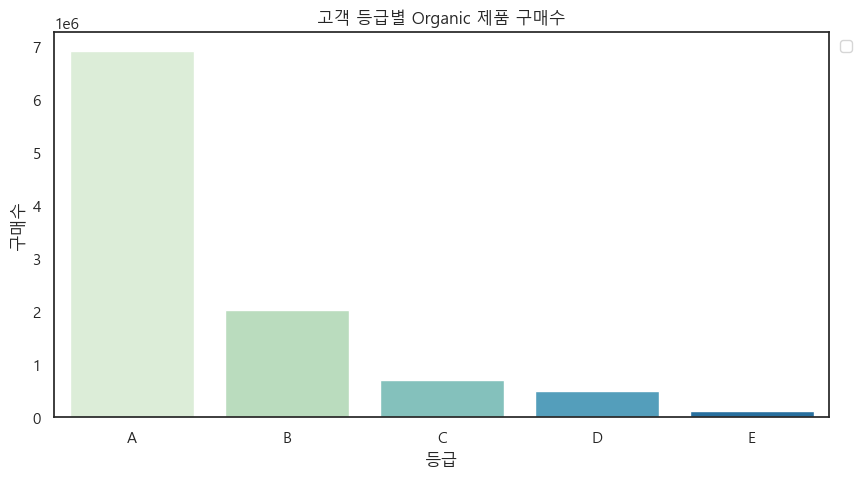

In [105]:
plt.figure(figsize=(10,5))
sns.barplot(data=organic_0, x='등급', y='구매수',palette='GnBu')
plt.title('고객 등급별 Organic 제품 구매수')
plt.ylabel('구매수')
plt.legend(loc='best', ncol=3, bbox_to_anchor=(1.04,1))

In [106]:
organic =product_seg_3[product_seg_3['제품명'].str.contains('100%')]
organic 

,고객 ID,제품명,count,등급
75,2,100% Mighty Mango Juice Smoothie,1,B
152,3,100% Recycled Paper Towels,1,C
209,7,Original No Pulp 100% Florida Orange Juice,8,B
468,11,100% Recycled 2 Ply Jumbo Paper Towel Roll,3,B
507,11,100% Recycled Bathroom Tissue,1,B
...,...,...,...,...
13307558,206206,2-Ply 100% Recycled Bathroom Tissue,1,A
13307559,206206,100% Organic Raw Pecan Nut Butter With Cashews,1,A
13307560,206206,100% Recycled Paper Towels,1,A
13307674,206207,Organic 100% Grapefruit Juice,1,B


### 🟠 그룹별 시간대 / 요일 

In [107]:
# total_info
# total_info[(total_info['주문 요일']=='화') & (total_info['고객 ID'] ==14629)] 
# Rank_info[Rank_info['고객 ID']==14643] # 중간점검_ID 등급확인

In [108]:
dow=total_info.groupby('주문 요일')['고객 ID'].value_counts().to_frame().reset_index()
dow['등급'] = dow['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])


dow=dow.groupby(['등급','주문 요일'])['count'].sum().to_frame().reset_index()

# dow[dow['등급']=='A'].sort_values(by='count', ascending=False)
dow

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2829079253.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2829079253.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,등급,주문 요일,count
0,A,금,2367825
1,A,목,2357475
2,A,수,2577821
3,A,월,3791663
4,A,일,2764583
5,A,토,2677944
6,A,화,3540134
7,B,금,815327
8,B,목,848806
9,B,수,937775


C:\Users\user\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\user\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



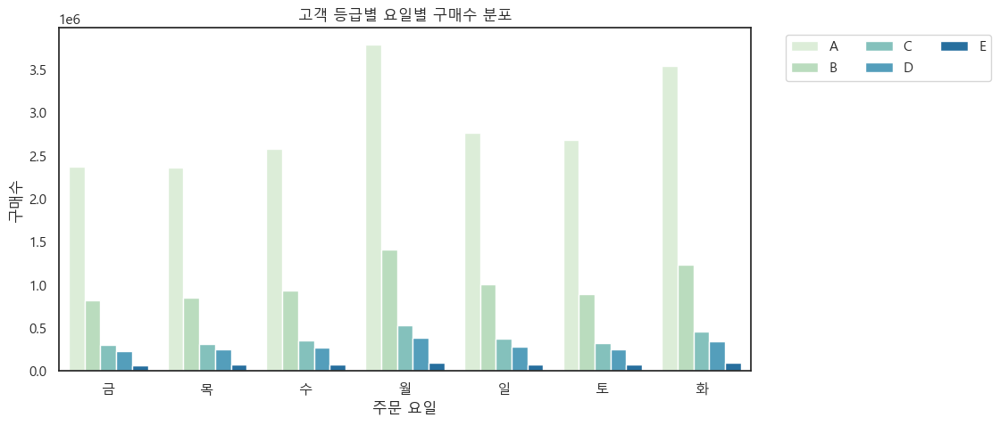

In [109]:
plt.figure(figsize=(10,5))
sns.barplot(data=dow, x='주문 요일', y='count',hue ='등급', palette='GnBu')
plt.title('고객 등급별 요일별 구매수 분포')
plt.ylabel('구매수')
plt.legend(loc='best', ncol=3, bbox_to_anchor=(1.04,1))

In [110]:
# 시간대 

In [111]:
total_info

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부,제품명,소분류 ID,대분류 ID,소분류명,대분류명
0,2539329,1,1,수,8,-1,196,1,0,Soda,77,7,soft drinks,beverages
1,2539329,1,1,수,8,-1,14084,2,0,Organic Unsweetened Vanilla Almond Milk,91,16,soy lactosefree,dairy eggs
2,2539329,1,1,수,8,-1,12427,3,0,Original Beef Jerky,23,19,popcorn jerky,snacks
3,2539329,1,1,수,8,-1,26088,4,0,Aged White Cheddar Popcorn,23,19,popcorn jerky,snacks
4,2539329,1,1,수,8,-1,26405,5,0,XL Pick-A-Size Paper Towel Rolls,54,17,paper goods,household
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434484,2977660,206209,13,화,12,7,14197,5,1,Tomato Paste,9,9,pasta sauce,dry goods pasta
32434485,2977660,206209,13,화,12,7,38730,6,0,Brownie Crunch High Protein Bar,3,19,energy granola bars,snacks
32434486,2977660,206209,13,화,12,7,31477,7,0,High Protein Bar Chunky Peanut Butter,3,19,energy granola bars,snacks
32434487,2977660,206209,13,화,12,7,6567,8,0,Chocolate Peanut Butter Protein Bar,3,19,energy granola bars,snacks


In [112]:
time=total_info.groupby('주문 시각')['고객 ID'].value_counts().to_frame().reset_index()
time['등급'] = time['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])

time=time.groupby(['등급','주문 시각'])['count'].sum().to_frame().reset_index()

time[time['등급']=='E'].sort_values(by='주문 시각', ascending=False)

,등급,주문 시각,count
119,E,23,6574
118,E,22,9994
117,E,21,12641
116,E,20,17389
115,E,19,23552
114,E,18,30890
113,E,17,37519
112,E,16,43759
111,E,15,45987
110,E,14,45811


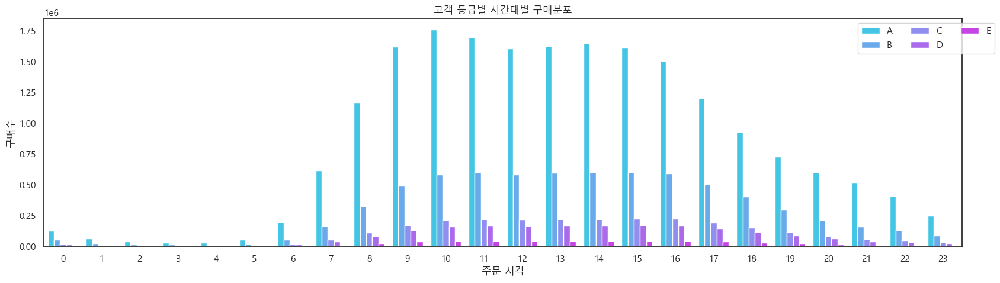

In [113]:
plt.figure(figsize=(20,5))
sns.barplot(data=time, x='주문 시각', y='count',hue ='등급', palette='cool')
plt.title('고객 등급별 시간대별 구매분포')
plt.ylabel('구매수')
plt.legend(loc='best', ncol=3, bbox_to_anchor=(1.04,1))

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



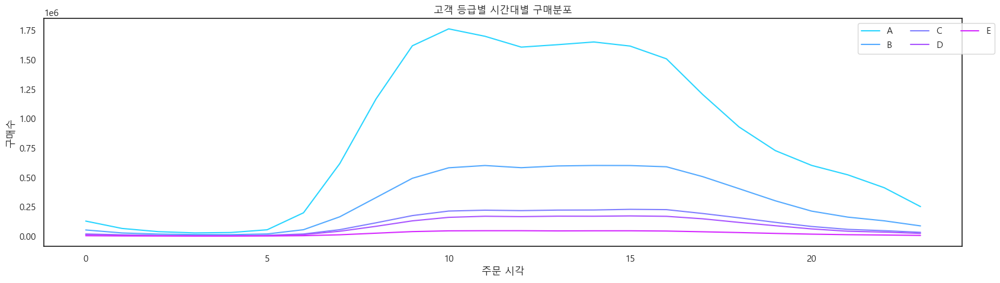

In [114]:
plt.figure(figsize=(20,5))
sns.lineplot(data=time, x='주문 시각', y='count',hue ='등급', palette='cool')
plt.title('고객 등급별 시간대별 구매분포')
plt.ylabel('구매수')
plt.legend(loc='best', ncol=3, bbox_to_anchor=(1.04,1))

In [115]:
# A 등급 고객이 활발한 모습 확인 

### 🟠 재주문율  -> 실패! (데이터 셋의 고객과 재주문율 엮는 것은 제품 구매횟수랑 똑같은 결과(

In [116]:
reorder = total_info[total_info['재주문 여부'] ==1]
reorder.groupby(['고객 ID','제품명'])['재주문 여부'].value_counts()

고객 ID   제품명                                                                                       재주문 여부
1       Aged White Cheddar Popcorn                                                                1         1
        Bag of Organic Bananas                                                                    1         1
        Cinnamon Toast Crunch                                                                     1         2
        Organic Half & Half                                                                       1         1
        Organic String Cheese                                                                     1         7
                                                                                                           ..
206209  Quick 1 Minute Whole Grain Oats                                                           1         1
        Raisin Bran Cereal                                                                        1         1
        Tomato 

In [117]:
total_info[(total_info['고객 ID'] ==1) & (total_info['제품명']=='Soda')]

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부,제품명,소분류 ID,대분류 ID,소분류명,대분류명
0,2539329,1,1,수,8,-1,196,1,0,Soda,77,7,soft drinks,beverages
5,2398795,1,2,목,7,15,196,1,1,Soda,77,7,soft drinks,beverages
11,473747,1,3,목,12,21,196,1,1,Soda,77,7,soft drinks,beverages
16,2254736,1,4,금,7,29,196,1,1,Soda,77,7,soft drinks,beverages
21,431534,1,5,금,15,28,196,1,1,Soda,77,7,soft drinks,beverages
29,3367565,1,6,수,7,19,196,1,1,Soda,77,7,soft drinks,beverages
33,550135,1,7,화,9,20,196,1,1,Soda,77,7,soft drinks,beverages
39,3108588,1,8,화,14,14,196,2,1,Soda,77,7,soft drinks,beverages
47,2295261,1,9,화,16,0,196,4,1,Soda,77,7,soft drinks,beverages
50,2550362,1,10,금,8,30,196,1,1,Soda,77,7,soft drinks,beverages


### 🟢 고객 등급별 제품 선호도 분석 

In [191]:
# 제품 선호도 분석 등급별로 분석하기 
# Ex. Organic 선호도를 보고싶어 => A등급 고객의 Organic 구매수 / A등급 고객의 전체 구매수
total_info[total_info['제품명'].str.contains('Whole')]

,주문 ID,고객 ID,주문 횟수,주문 요일,주문 시각,주문 간격,제품 ID,카트 추가 순서,재주문 여부,제품명,소분류 ID,대분류 ID,소분류명,대분류명
101,1673511,2,5,목,11,8,48210,6,0,Whole Wheat Blueberry Fig Bars,48,14,breakfast bars pastries,breakfast
253,839880,2,14,목,10,13,7963,16,0,Gluten Free Whole Grain Bread,58,1,frozen breads doughs,frozen
278,3002854,3,3,목,16,21,7503,6,0,Whole Almonds,117,19,nuts seeds dried fruit,snacks
291,2710558,3,5,월,17,12,22035,8,0,Organic Whole String Cheese,21,16,packaged cheese,dairy eggs
295,1972919,3,6,월,16,7,22035,1,1,Organic Whole String Cheese,21,16,packaged cheese,dairy eggs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434446,2266710,206209,10,토,18,29,26503,4,0,Classic Vegetables Whole Kernel Corn,116,1,frozen produce,frozen
32434448,2266710,206209,10,토,18,29,23800,6,0,Whole Grain Cereal,121,14,cereal,breakfast
32434469,626363,206209,12,화,12,18,43961,10,1,Organic Peeled Whole Baby Carrots,123,4,packaged vegetables fruits,produce
32434470,626363,206209,12,화,12,18,23800,11,1,Whole Grain Cereal,121,14,cereal,breakfast


In [119]:
prefer_0 = total_info.groupby('고객 ID')['제품명'].value_counts().to_frame().reset_index()
prefer_0['등급'] = prefer_0['고객 ID'].map(Rank_info.set_index('고객 ID')['고객 등급'])
prefer_0

,고객 ID,제품명,count,등급
0,1,Soda,10,D
1,1,Original Beef Jerky,10,D
2,1,Pistachios,9,D
3,1,Organic String Cheese,8,D
4,1,Cinnamon Toast Crunch,3,D
...,...,...,...,...
13307948,206209,Organic 1% Low Fat Milk,1,B
13307949,206209,Organic Diced Tomatoes,1,B
13307950,206209,Organic Mexican Blend Finely Shredded Cheese,1,B
13307951,206209,Organic Raw Unfiltered Apple Cider Vinegar,1,B


In [120]:
# 등급별 총구매수 
prefer_1 = prefer_0.groupby('등급')['count'].sum().reset_index()
prefer_1


,등급,count
0,A,20077445
1,B,7146108
2,C,2655905
3,D,2005636
4,E,549395


In [121]:
#❗❗여기에 비율 컬럼을 추가해라 제품명에 따른 
organic =product_seg_3[product_seg_3['제품명'].str.contains('Bag')]
organic 


organic=organic.groupby('등급')['count'].sum().to_frame().reset_index()
# organic = organic.rename({'count':'구매수'}, axis=1)
# organic  

In [188]:
name = input("제품 이름을 입력하세요")

for col in prefer_1.columns:
    if '구매수' in col:
        prefer_1.drop(columns=[col], inplace=True)
        
prefer_name =prefer_0[prefer_0['제품명'].str.contains(f'{name}')]
prefer_name=prefer_name.groupby('등급')['count'].sum().to_frame().reset_index()
prefer_1[f"{name} 구매수"] = prefer_name['count']       
prefer_1['비율'] = round(prefer_1[f"{name} 구매수"] / prefer_1['count']*100,2)


prefer_1

제품 이름을 입력하세요 Bag


,등급,count,비율,Bag 구매수
0,A,20077445,2.53,507372
1,B,7146108,2.32,165846
2,C,2655905,2.32,61489
3,D,2005636,2.46,49409
4,E,549395,2.88,15807


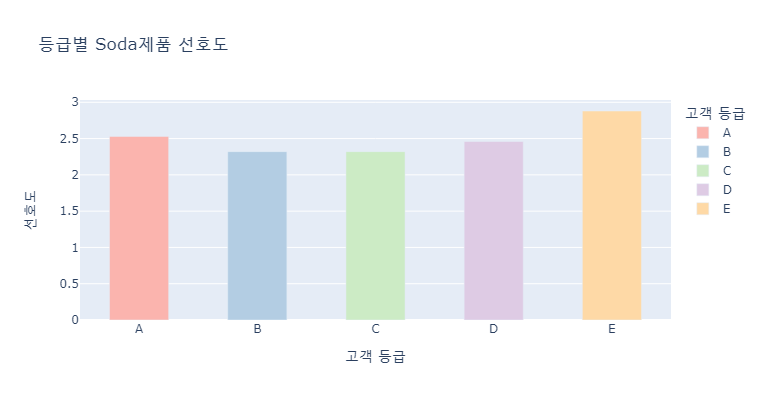

In [189]:
%config InlineBackend.figure_format = 'retina'

fig = px.bar(data_frame = prefer_1, x= '등급', y='비율', color = '등급', labels=dict(등급='고객 등급', 비율='선호도'), title= f'등급별 {i}제품 선호도', color_discrete_sequence=px.colors.qualitative.Pastel1)
fig.update_layout(bargap=0.5,width=400, height=400)
fig.show()

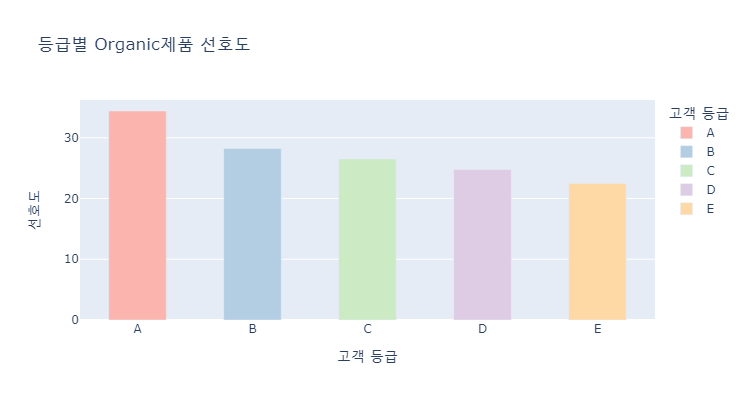

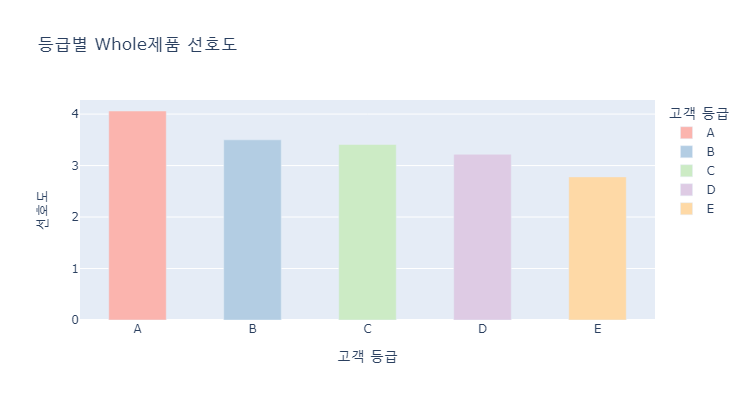

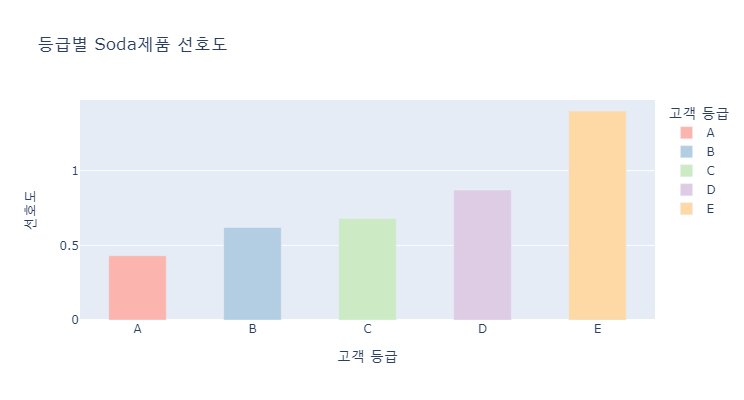

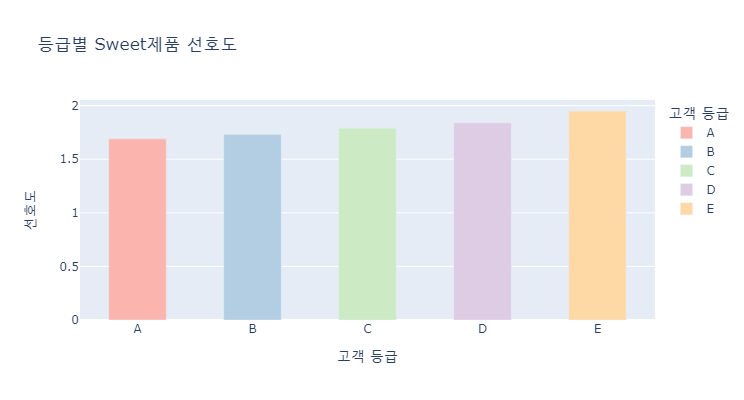

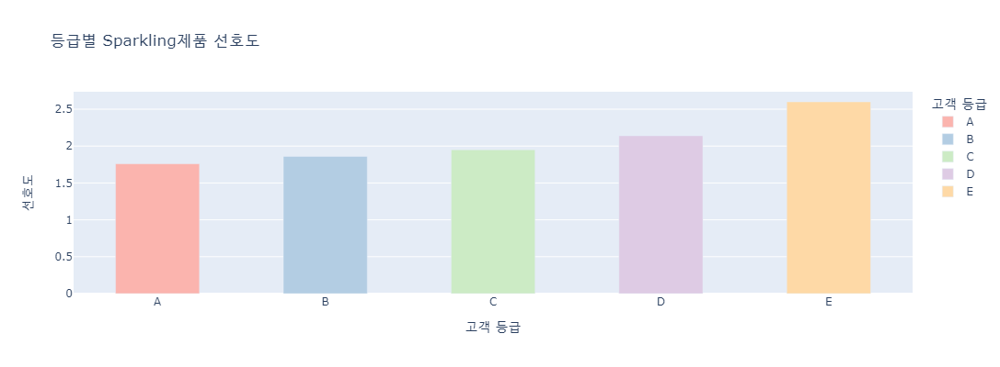

...

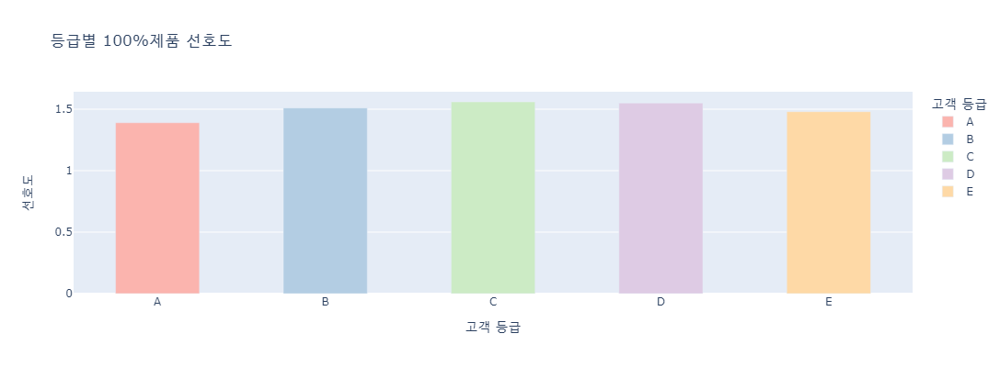

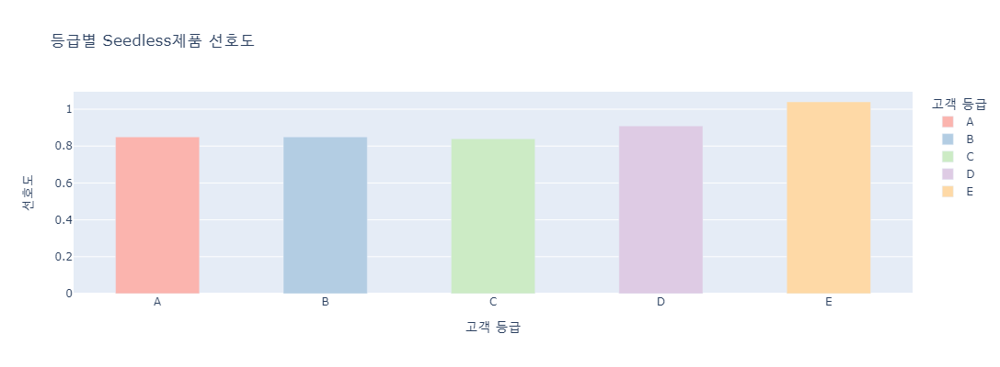

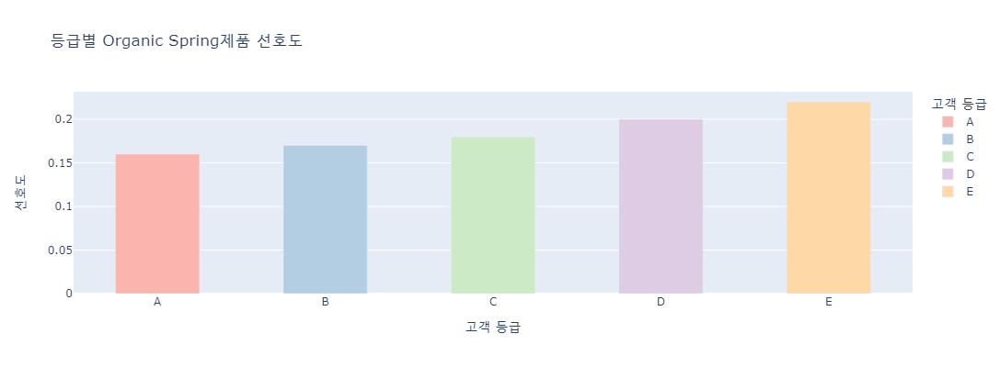

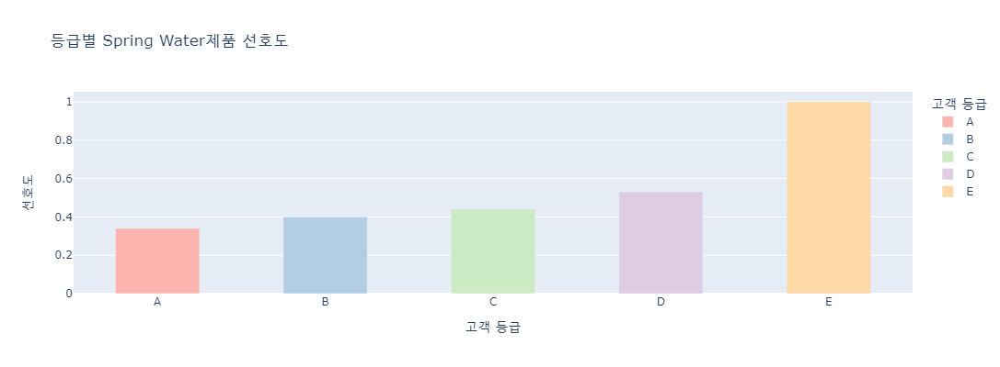

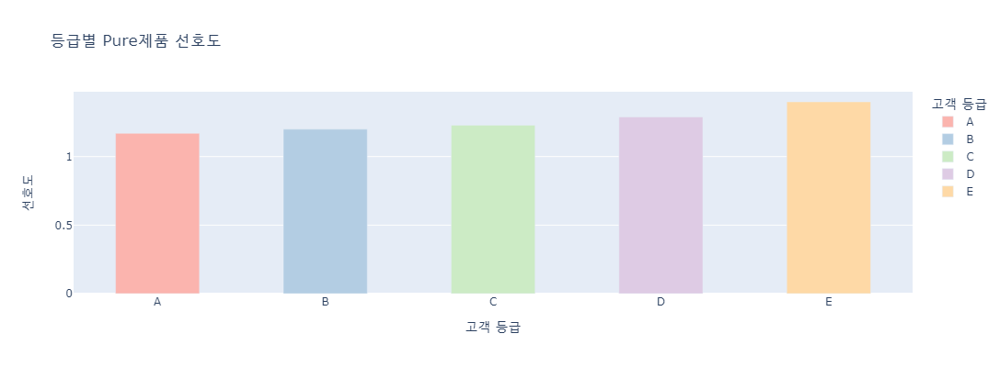

In [190]:
list = ['Organic', 'Whole', 'Soda', 'Sweet', 'Sparkling', 'Mix', '100%', 'Seedless', 'Organic Spring','Spring Water','Pure']
for i in list:
    name = i
    for col in prefer_1.columns:
        if '구매수' in col:
            prefer_1.drop(columns=[col], inplace=True)
        
    prefer_name =prefer_0[prefer_0['제품명'].str.contains(f'{name}')]
    prefer_name=prefer_name.groupby('등급')['count'].sum().to_frame().reset_index()
    prefer_1[f"{name} 구매수"] = prefer_name['count']       
    prefer_1['비율'] = round(prefer_1[f"{name} 구매수"] / prefer_1['count']*100,2)

    
    %config InlineBackend.figure_format = 'retina'

    fig = px.bar(data_frame = prefer_1, x= '등급', y='비율', color = '등급', labels=dict(등급='고객 등급', 비율='선호도'), title= f'등급별 {i}제품 선호도', color_discrete_sequence=px.colors.qualitative.Pastel1)
    fig.update_layout(bargap=0.5,width=400, height=400)
    fig.show()

### 🟢 고객 등급별 시간/요일대 선호도 분석

In [124]:
# 등급별 요일 션호도 비교 

In [193]:
day = input("요일을 입력하시오: ")

day_name = dow[dow['주문 요일'].str.contains(f'{day}')] # 요일 구매수

dow_sum =dow.groupby('등급')['count'].sum().to_frame().reset_index() # 총구매수
day_name['총구매수'] = day_name['등급'].map(dow_sum.set_index('등급')['count'])

day_name['비율'] = round(day_name['count'] / day_name['총구매수']*100,2)
day_name

# dow


요일을 입력하시오:  월


C:\Users\user\AppData\Local\Temp\ipykernel_8136\3403479311.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\3403479311.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,등급,주문 요일,count,총구매수,비율
3,A,월,3791663,20077445,18.89
10,B,월,1410317,7146108,19.74
17,C,월,531440,2655905,20.01
24,D,월,381631,2005636,19.03
31,E,월,94615,549395,17.22


C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



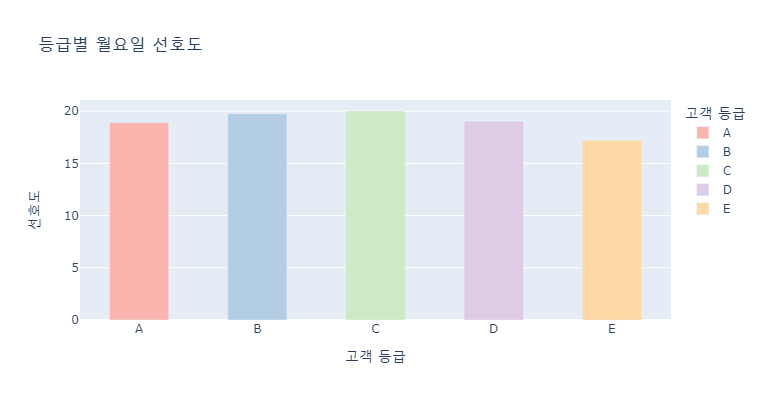

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



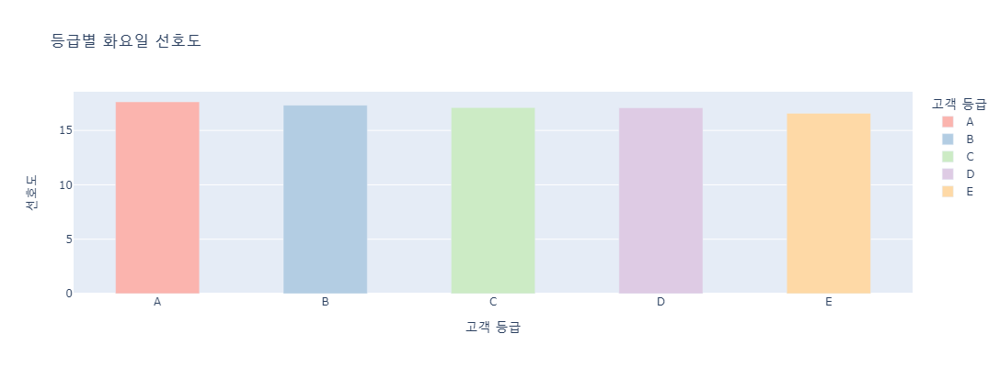

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



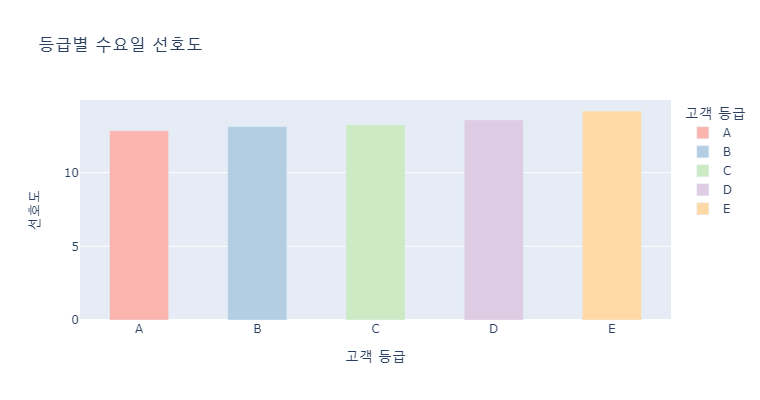

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



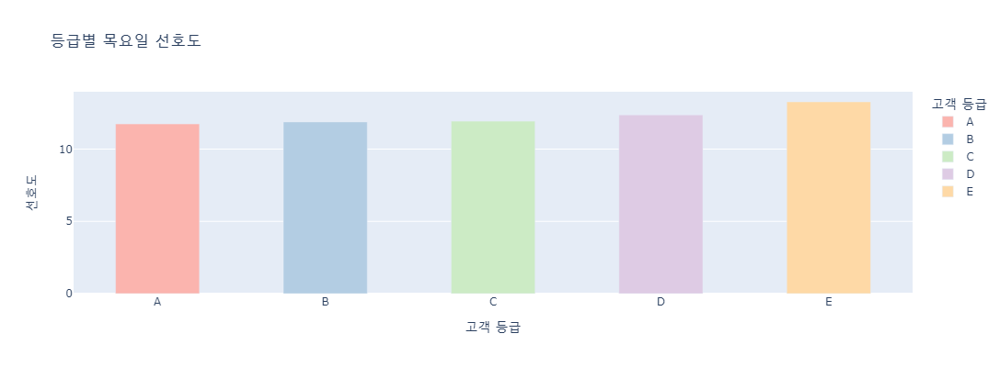

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



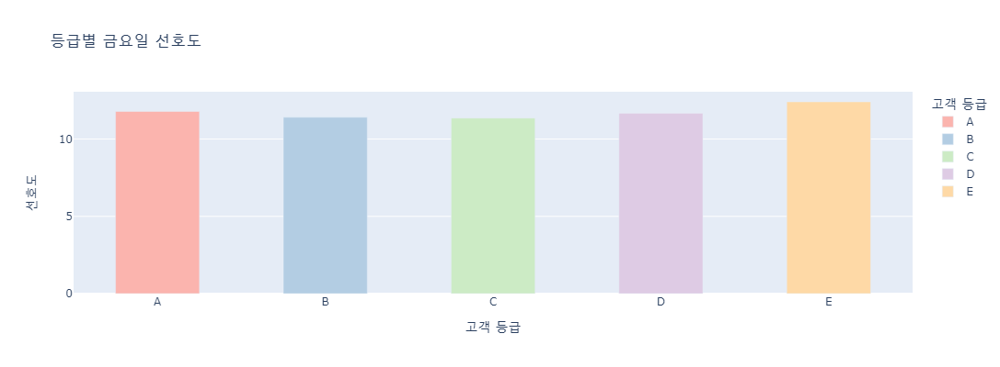

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



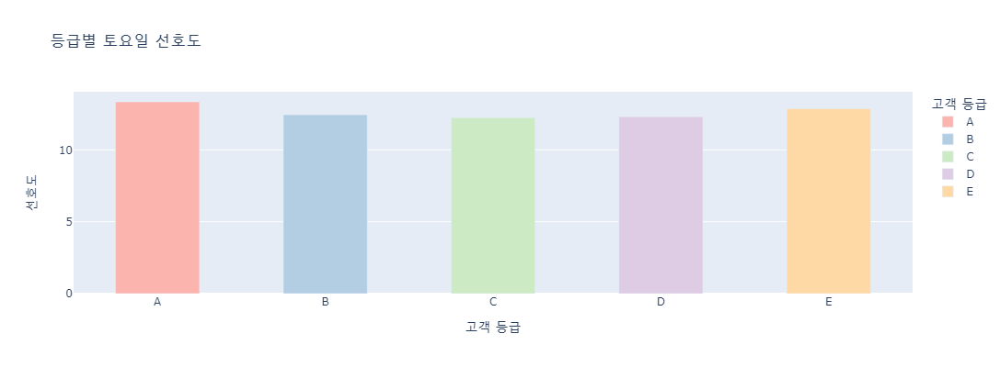

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1238419008.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



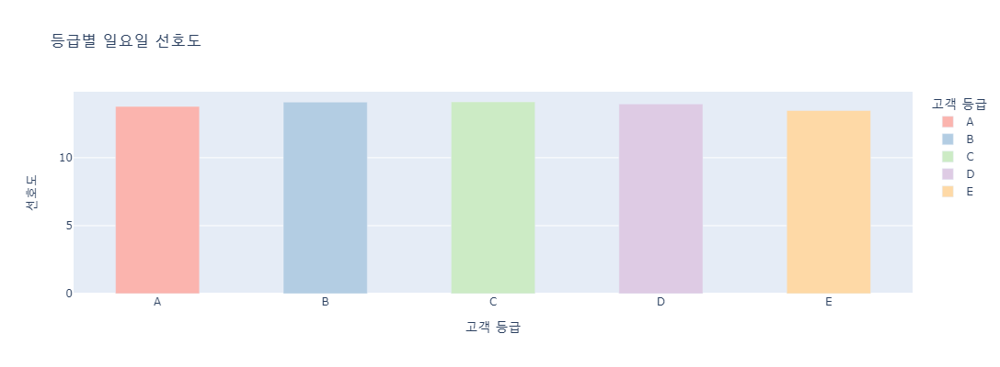

In [194]:
list_dow = ['월', '화', '수', '목', '금', '토', '일']
for i in list_dow:
    name = i
    day_name = dow[dow['주문 요일'].str.contains(i)] # 요일 구매수

    dow_sum =dow.groupby('등급')['count'].sum().to_frame().reset_index() # 총구매수
    day_name['총구매수'] = day_name['등급'].map(dow_sum.set_index('등급')['count'])

    day_name['비율'] = round(day_name['count'] / day_name['총구매수']*100,2)

    
    %config InlineBackend.figure_format = 'retina'

    fig = px.bar(data_frame = day_name, x= '등급', y='비율', color = '등급', labels=dict(등급='고객 등급', 비율='선호도'), title= f'등급별 {i}요일 선호도', color_discrete_sequence=px.colors.qualitative.Pastel1)
    fig.update_layout(bargap=0.5,width=400, height=400)
    fig.show()

In [127]:
#등급별 월화수목금 선호도 (연습)
# dow
dow_a = dow[dow['등급']=='A']

days_order=['월','화','수','목','금','토','일']
dow_a['요일'] = pd.Categorical(dow_a['주문 요일'], categories=days_order, ordered=True)
dow_a = dow_a.sort_values('요일')

dow_a = dow_a.drop('요일', axis=1)
dow_a

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1595253087.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,등급,주문 요일,count
3,A,월,3791663
6,A,화,3540134
2,A,수,2577821
1,A,목,2357475
0,A,금,2367825
5,A,토,2677944
4,A,일,2764583


In [128]:
#등급별 월화수목금 선호도 
dow_list = ['A','B','C','D','E']
for i in dow_list:
    
    dow_a = dow[dow['등급']== i]
    days_order=['월','화','수','목','금','토','일']
    dow_a['주문 요일'] = pd.Categorical(dow_a['주문 요일'], categories=days_order, ordered=True)
    dow_a = dow_a.sort_values('주문 요일')

    dow_a

C:\Users\user\AppData\Local\Temp\ipykernel_8136\1741864179.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [129]:
dow

,등급,주문 요일,count
0,A,금,2367825
1,A,목,2357475
2,A,수,2577821
3,A,월,3791663
4,A,일,2764583
5,A,토,2677944
6,A,화,3540134
7,B,금,815327
8,B,목,848806
9,B,수,937775


### 🟢등급별 선호 시간대 

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



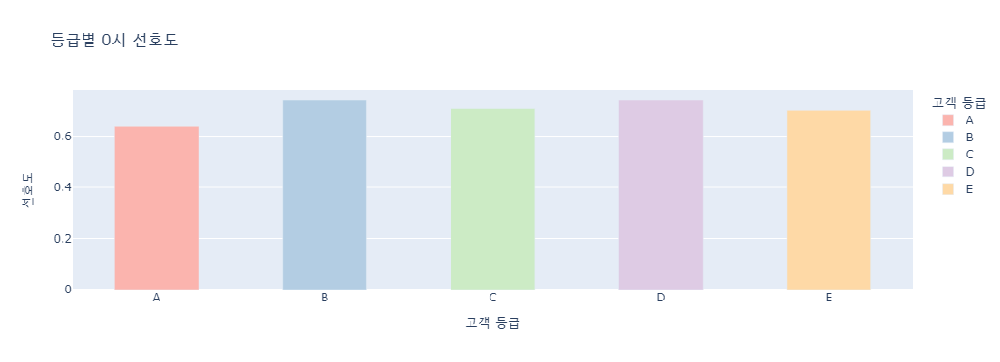

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



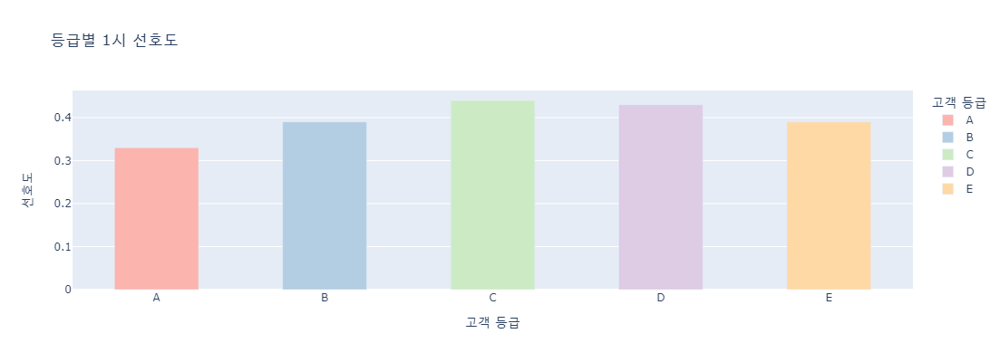

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



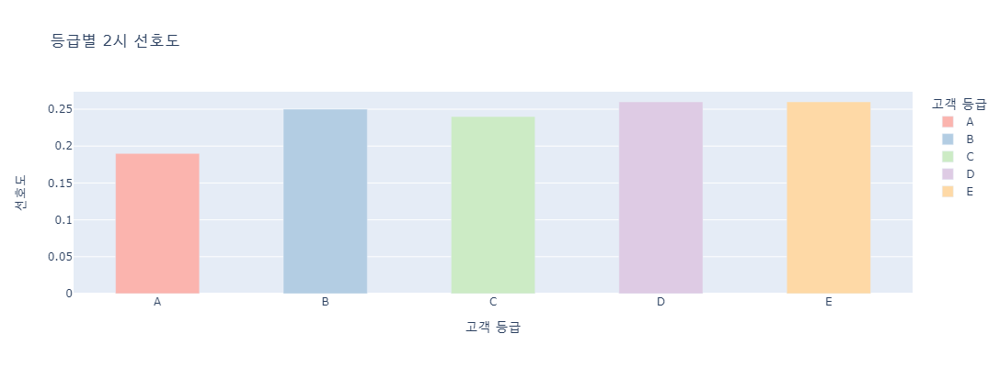

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



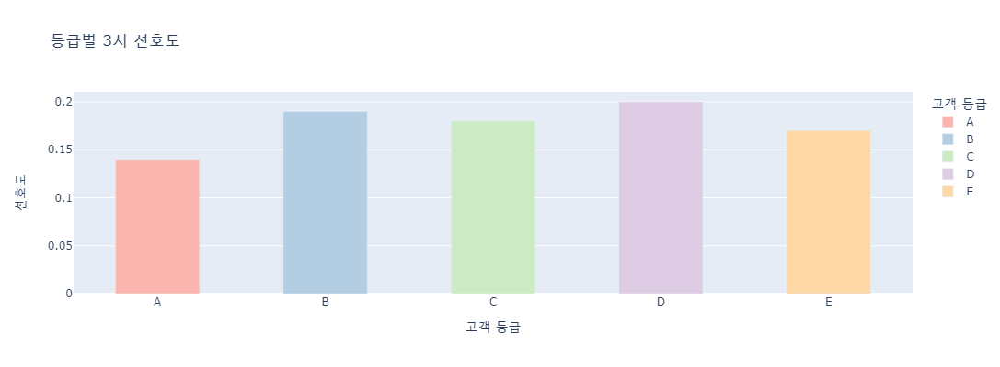

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



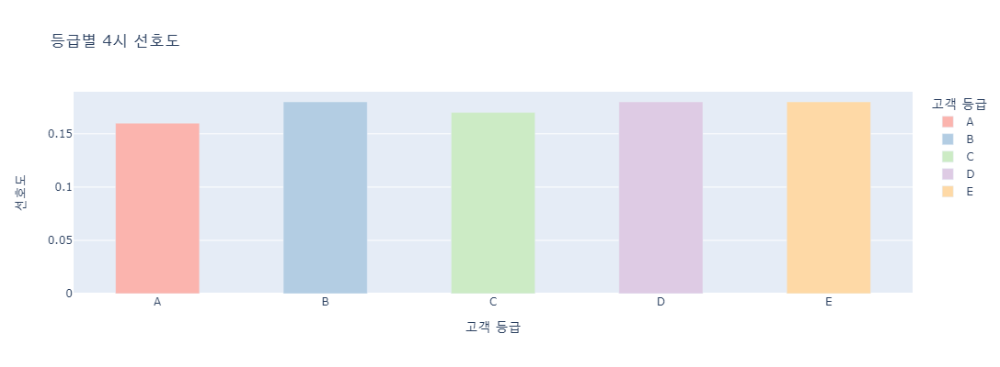

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



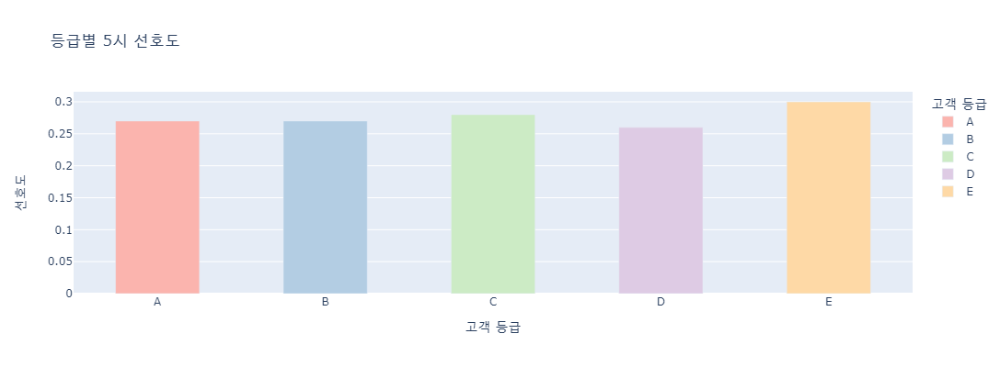

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



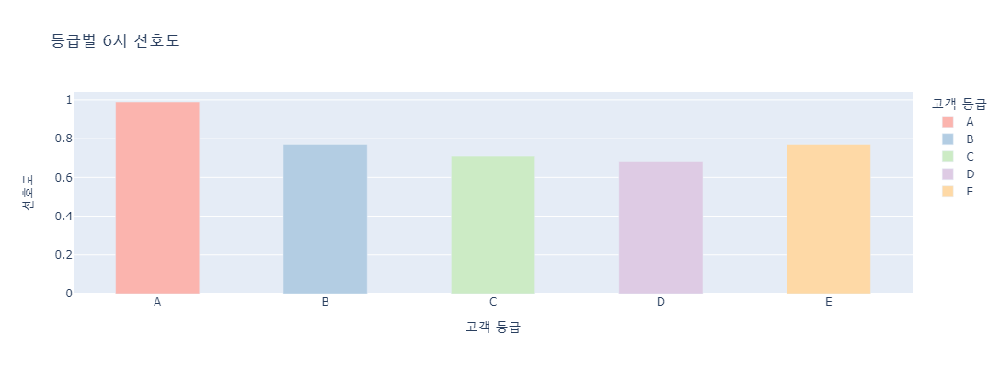

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



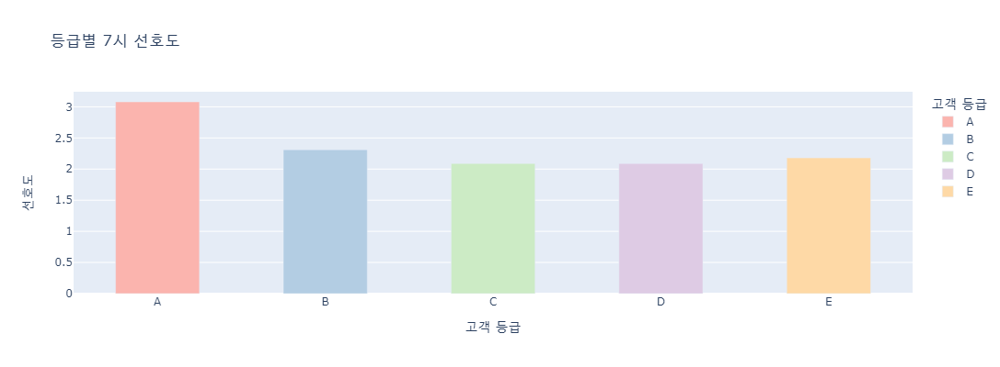

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



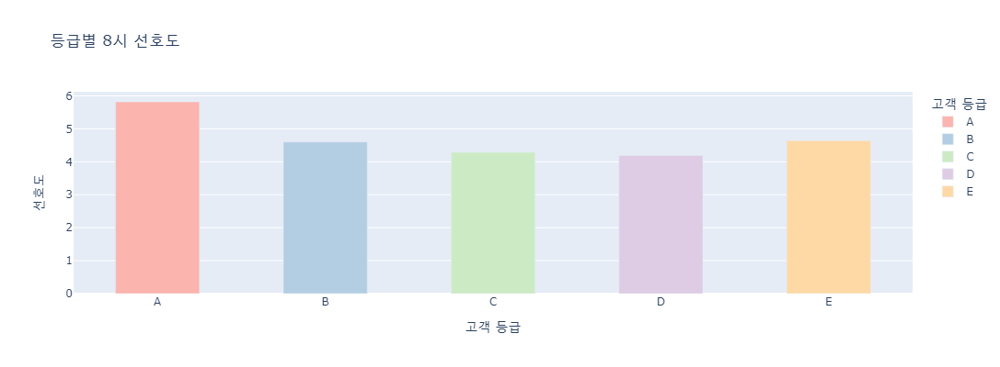

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



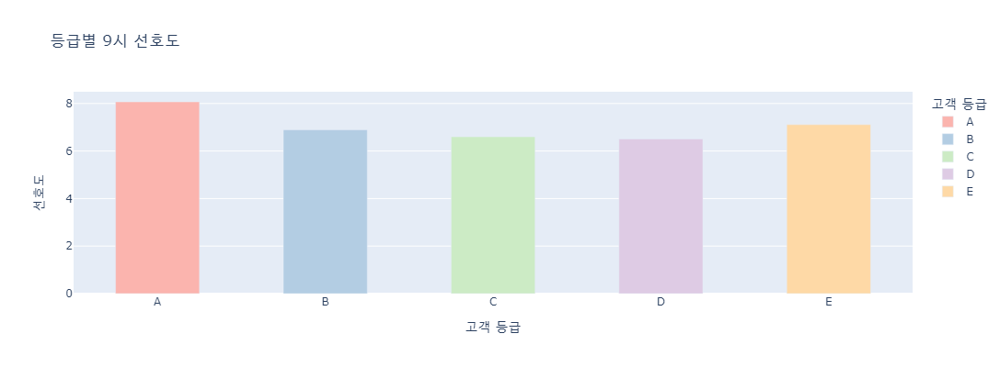

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



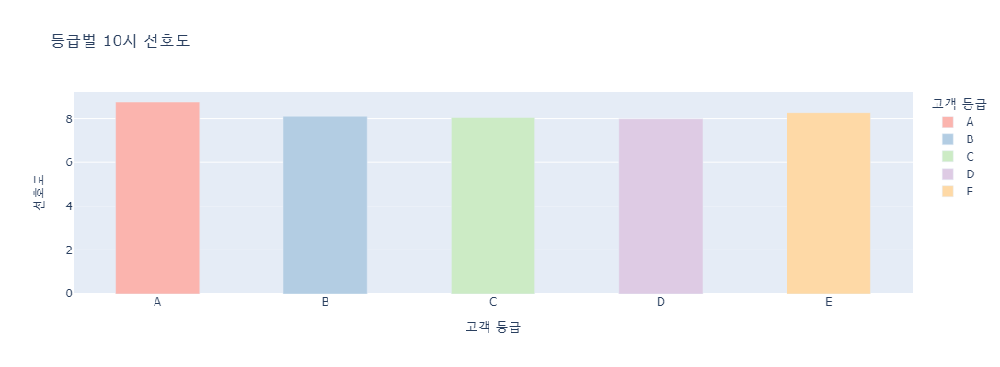

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



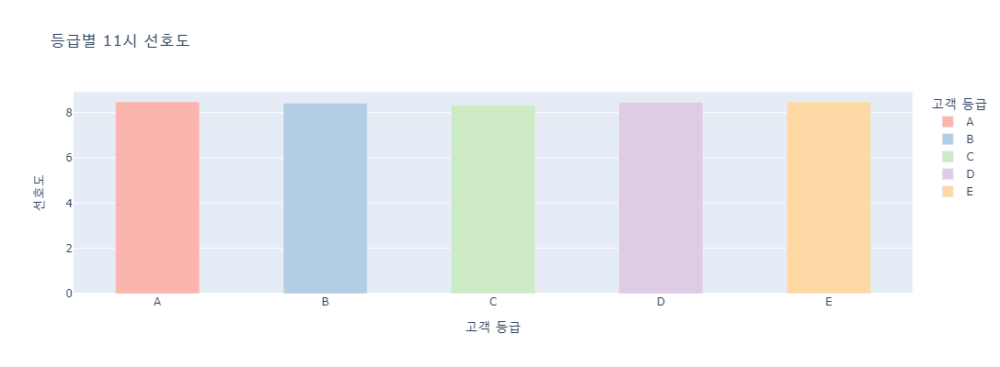

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



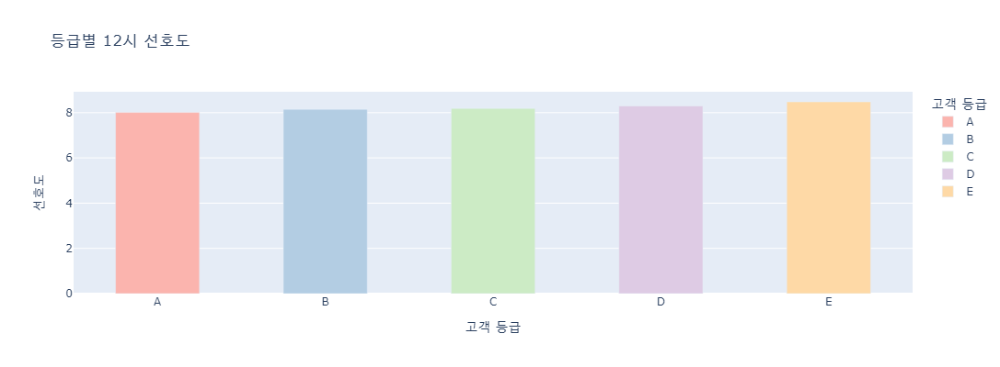

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



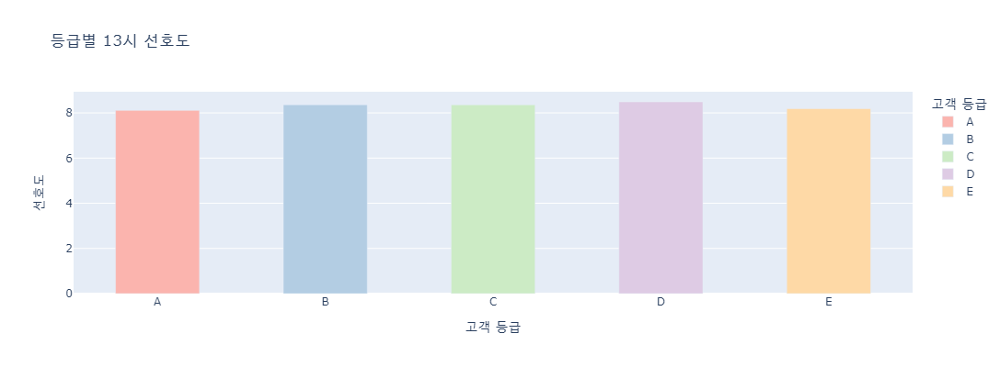

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



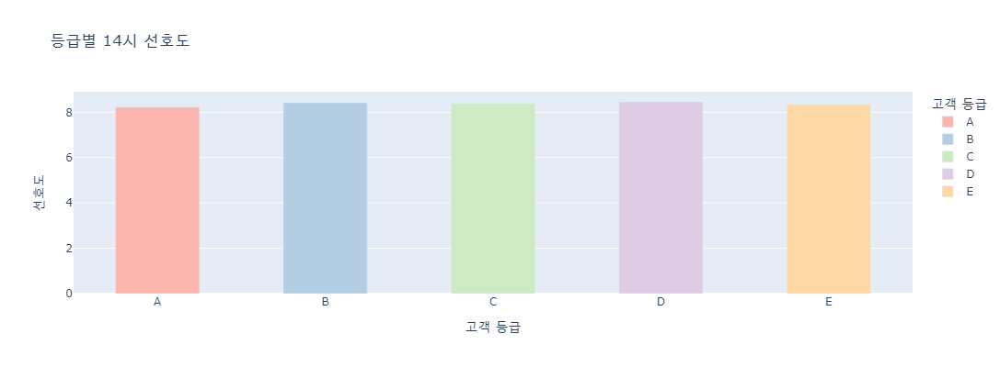

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



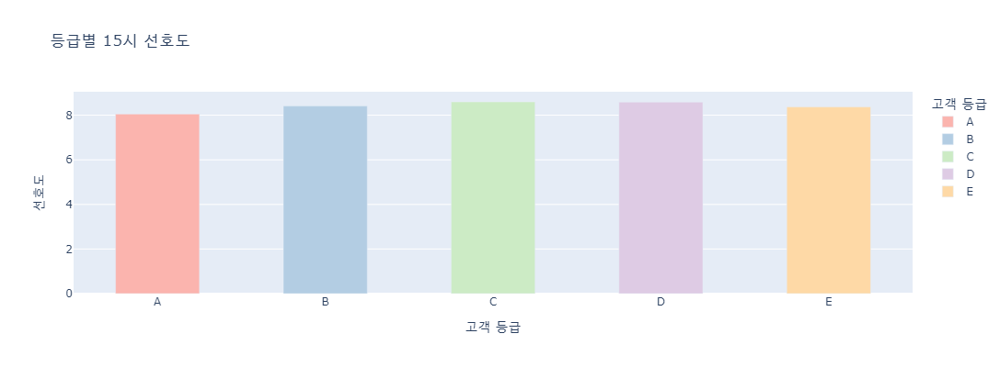

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



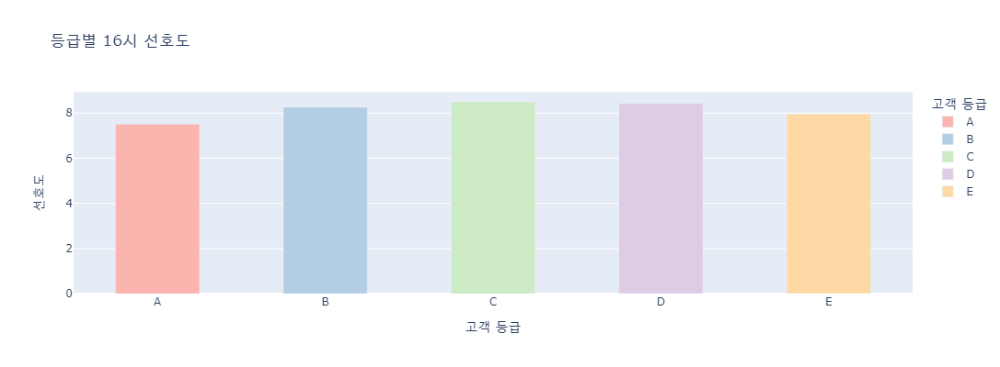

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



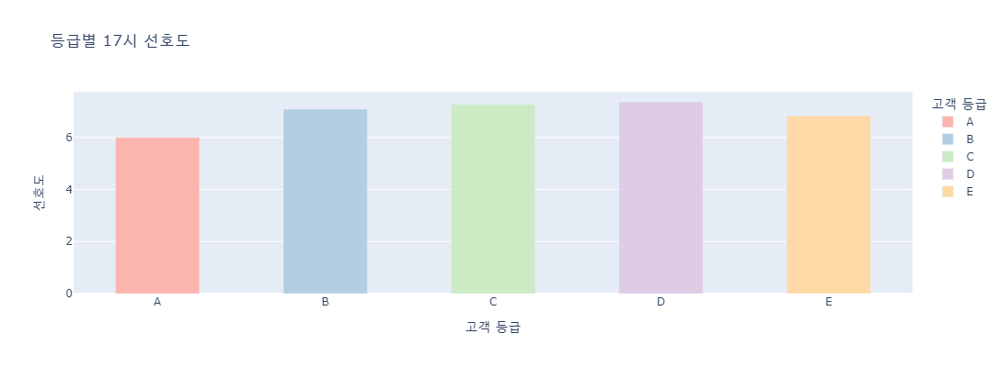

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



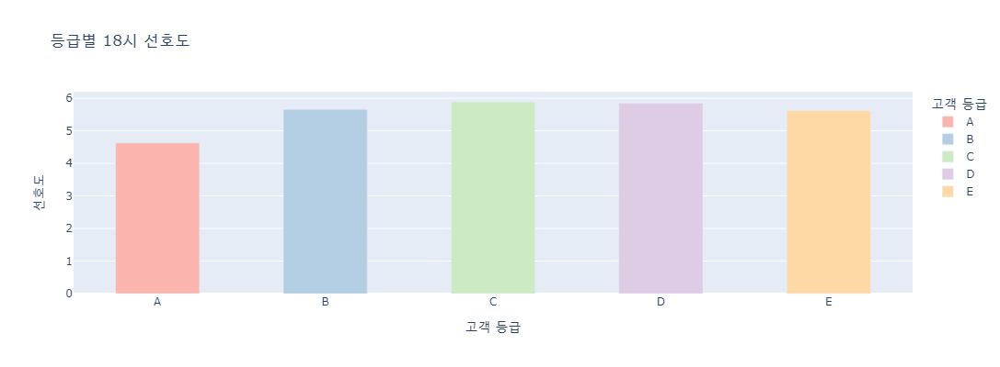

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



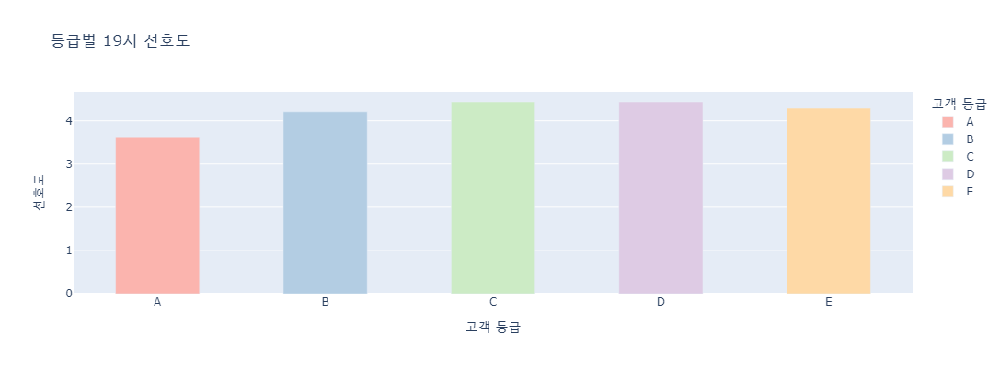

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



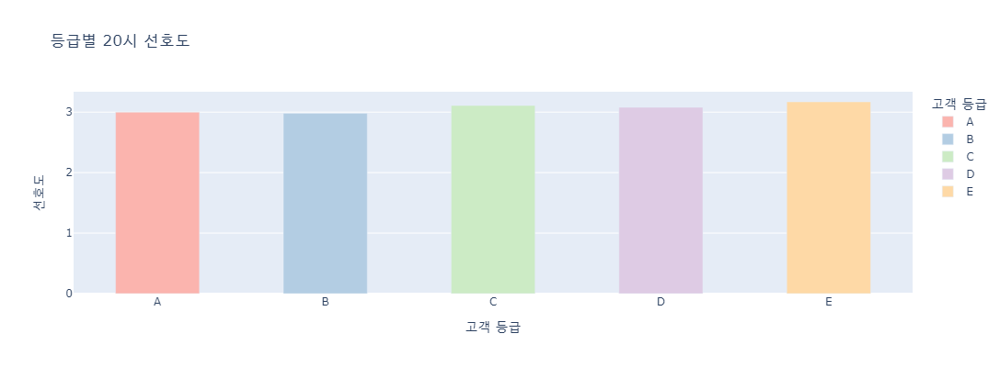

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



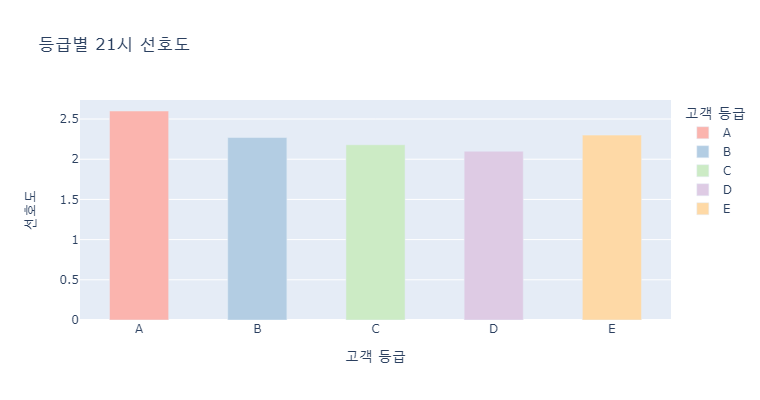

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



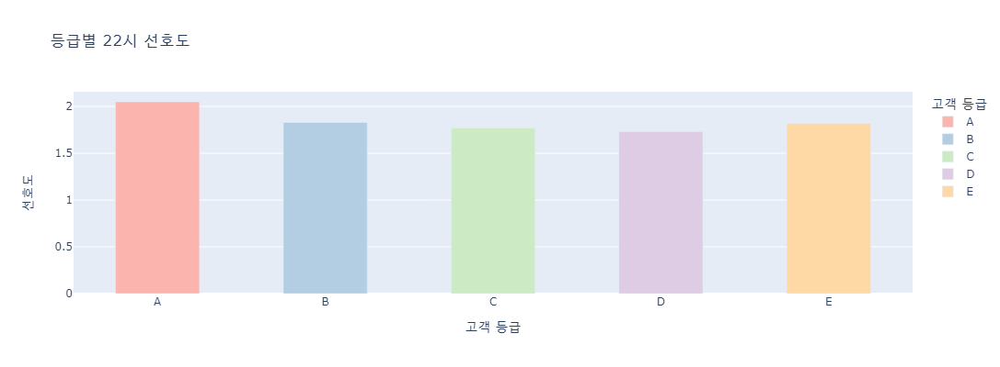

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_8136\2753570842.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



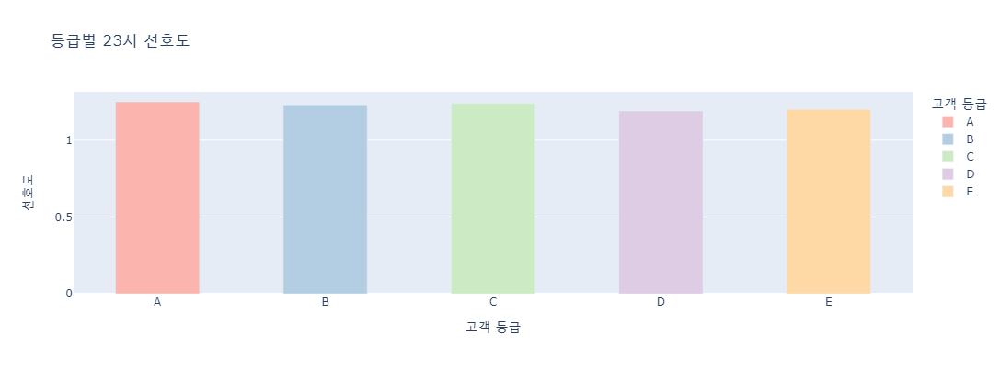

In [198]:

for i in range(0,24):
    name = i
    time_name = time[time['주문 시각'] == i] # 요일 구매수

    time_sum =time.groupby('등급')['count'].sum().to_frame().reset_index() # 총구매수
    time_name['총구매수'] = time_name['등급'].map(time_sum.set_index('등급')['count'])

    time_name['비율'] = round(time_name['count'] / time_name['총구매수']*100,2)

    
    %config InlineBackend.figure_format = 'retina'

    fig = px.bar(data_frame = time_name, x= '등급', y='비율', color = '등급', labels=dict(등급='고객 등급', 비율='선호도'), title= f'등급별 {i}시 선호도', color_discrete_sequence=px.colors.qualitative.Pastel1)
    fig.update_layout(bargap=0.5,width=400, height=400)
    fig.show()

In [196]:
time

,등급,주문 시각,count
0,A,0,128532
1,A,1,65830
2,A,2,38491
3,A,3,27982
4,A,4,31219
...,...,...,...
115,E,19,23552
116,E,20,17389
117,E,21,12641
118,E,22,9994
